# 问题列表
1. [ ] bert 与 transformer 区别
2. [ ] 描述 transformer 结构
3. [X] 用过哪些激活函数
4. [X] 用过哪些归一化方法？ 及其优劣
5. [X] flashattention 原理
6. [X] kv cache 原理
7. [X] deep speed 原理
8. [ ] 不同推理引擎的性能差异和工能
9. [ ] llm 的 pretrain 和 sft  训练流程
11. [ ] clip 原理
12. [ ] blip 原理
13. [ ] rag 原理


# 激活函数

refer to: 
- https://www.cnblogs.com/XDU-Lakers/p/10557496.html
- https://www.cnblogs.com/liuxiaochong/p/13469646.html
- https://finance.sina.cn/tech/2021-02-24/detail-ikftssap8455930.d.html

激活函数引入非线性的因素, 使神经网络可以逼近任何非线性函数

**饱和激活函数**

假设激活函数为$g(z)$, 如果$ \lim\limits_{z \to + \infty} g^{'}(z) = 0$, 称为右饱和; 如果$ \lim\limits_{z \to - \infty} g^{'}(z) = 0$, 称为左饱和。既满足左饱和又满足右饱和的激活函数称为饱和激活函数

sigmoid 和 tanh 是"饱和激活函数", 而 ReLU 及其变体则是"非饱和激活函数"。使用"非饱和激活函数"的优势在于: (1)"非饱和激活函数"能解决"梯度消失"问题; (2)能加快收敛速度


## Sigmoid函数
$$ g(z) = \frac{1}{1 + e^{-z}} $$
$$ \frac{d}{dz}g(z) = \frac{1}{1 + e^{-z}} \left( 1 - \frac{1}{1 + e^{-z}}\right) = g(z)(1 - g(z)) $$

优点:
1. 将(-$\inf$, $\inf$)的输入特征值压缩至[0, 1], 对每个神经元的输出进行归一化, 适用于将预测概率作为输出的模型
5. 梯度平滑, 避免"跳跃"的输出值

缺点：
1. **梯度消失**。sigmoid的导数都是小于0.25的，那么在进行反向传播的时候，梯度相乘结果会慢慢的趋*于0。这样，几乎就没有梯度信号通过神经元传递到前面层的梯度更新中，因此这时前面层的权值几乎没有更新
3. 输出不是0均值。这是不可取的, 因为这会导致后一层的神经元将得到上一层输出的非0均值的信号作为输入。 产生的一个结果就是: 如果 $x > 0,\ f = w^T x + b$, 那么对$w$求局部梯度则都为正, 这样在反向传播的过程中$w$要么都往正方向更新, 要么都往负方向更新, 导致有一种捆绑的效果, 使得收敛缓慢。当然了, 如果按 batch 去训练, 那么那个 batch 可能得到不同的信号, 所以这个问题还是可以缓解一下的。因此, 非0均值这个问题虽然会产生一些不好的影响, 不过跟上面提到的梯度消失问题相比还是要好很多的。(https://blog.csdn.net/tyhj_sf/article/details/79932893)
4. 幂运算耗时较高

详细数学分析见文章：http://neuralnetworksanddeeplearning.com/chap5.html 

## Tanh 函数
$$ \text{tanh}(z) = \frac{e^z - e^{-z}}{e^z + e^{-z}} = \frac{2}{1 + e^{-2z}} - 1 = 2 * \text{sigmoid}(2z)-1 $$
$$ \frac{d}{dz} \text{tanh}(z) = 1 - \tanh^2(z) $$

优点:
1. 解决了 Sigmoid 函数输出不是0均值的问题
2. 导数取值范围在[0, 1], 优于 Sigmoid 导数取值范围的 [0, 0.25], 收敛更快

缺点:
1. 与Sigmoid函数类似, 梯度消失问题仍然存在
2. 幂运算耗时问题仍然存在

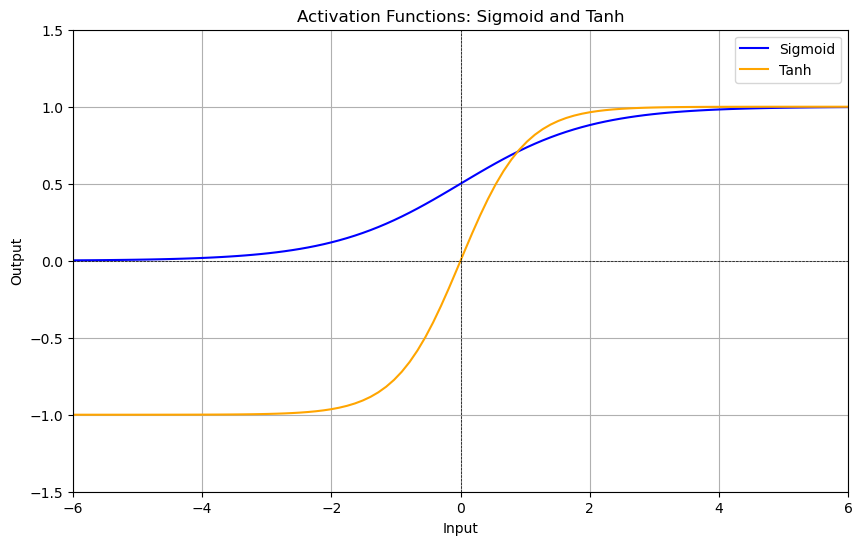

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# 定义 Sigmoid 函数
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# 定义 Tanh 函数
def tanh(x):
    return np.tanh(x)

# 生成数据
x = np.linspace(-6, 6, 100)

# 计算激活函数的值
y_sigmoid = sigmoid(x)
y_tanh = tanh(x)

# 绘图
plt.figure(figsize=(10, 6))
plt.plot(x, y_sigmoid, label='Sigmoid', color='blue')
plt.plot(x, y_tanh, label='Tanh', color='orange')
plt.title('Activation Functions: Sigmoid and Tanh')
plt.xlabel('Input')
plt.ylabel('Output')
plt.axhline(0, color='black', lw=0.5, ls='--')
plt.axvline(0, color='black', lw=0.5, ls='--')
plt.grid()
plt.legend()
plt.xlim(-6, 6)
plt.ylim(-1.5, 1.5)
plt.show()

## Relu 函数

[ImageNet Classification with Deep Convolutional Neural Networks](https://proceedings.neurips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf) 2012

$$\text{Relu}(z) = \begin{cases} z, \text{if } z \geq 0 \\ 0, \text{if } z < 0 \end{cases}$$

优点:
1. 相较于 Sigmoid 函数和 Tanh 函数, 当输入为正时, Relu函数不存在饱和问题, 即解决梯度消失问题
2. 分段线性, 计算速度快
3. 由于线性和非饱和, 收敛速度比 Sigmoid 和 Tanh 快
4. Relu 会使一部分神经元输出为0, 在带来网络稀疏性的同时, 也减少了参数之间的关联性, 一定程度上缓解过拟合问题

缺点: 
1. Relu 的输出也不是0均值的
3. **Dead Relu 问题**。当输入为负时, 梯度将完全为零, 进而导致相应参数一直无法更新, 某些神经元可能永远不会被激活
5. 当输入为正时, 导数为1, 不会出现梯度消失, 但梯度的下降完全取决于权值的乘积, 可能会导致梯度爆炸问题

## Leaky Relu 函数
[Rectifier Nonlinearities Improve Neural Network Acoustic Models](https://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf) 2013

$$\text{Leaky Relu}(z) = \begin{cases} z, \text{if } z \geq 0 \\ \alpha z, \text{if } z < 0 \end{cases}$$

优点:
1. 针对 Relu 的 Dead Relu 问题, Leaky Relu 在输入为负值时, 给输入值一个很小的斜率, 解决负输入的0梯度问题, 很好地缓解了 Dead Relu 问题
2. 对于所有的输入, 不管是大于等于0还是小于0, 神经元不饱和

缺点: 
1. 理论上, 该函数比 Relu 函数效果更好, 但是大量实践表明, 其效果不稳定, 故在实际中应用不多
2. 引入超参数: 值的选择需要调优，增加了模型复杂度。$\alpha$ 需要通过先验知识人工赋值, 通常为0.01左右 

## ELU 函数
$$\text{ELU}(z) = \begin{cases} z, \text{if } z \geq 0 \\ \alpha (e^z - 1), \text{if } z < 0 \end{cases}$$

优点: 
1. ELU具有Relu的大多数优点, 不存在 Dead Relu 问题
2. 通过减少偏置偏移的影响, 使正常梯度更接近于单位自然梯度, 从而使均值向零加速学习
3. 在较小的输入下会饱和至负值, 从而减少前向传播的变异和信息

缺点: 
1. 幂运算耗时高
2. 在实践中, 同样没有像 Relu 一样优秀的效果, 故应用不多

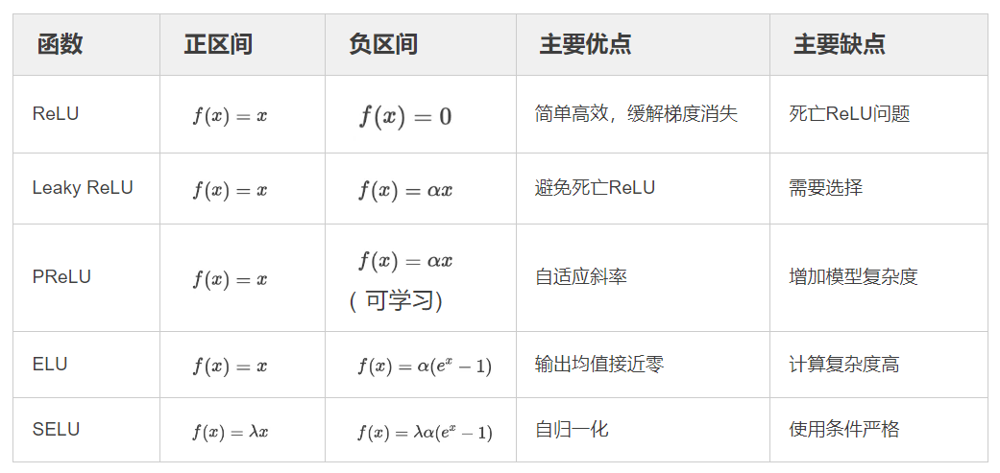

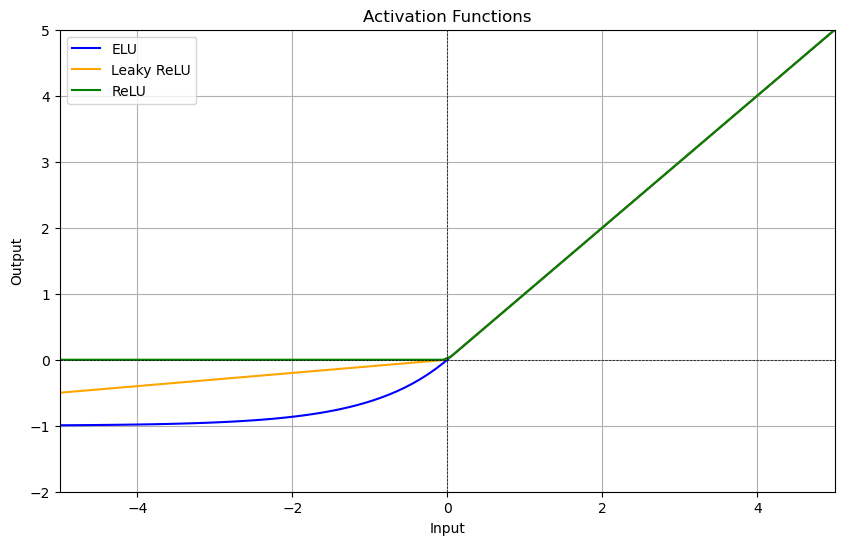

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# 定义激活函数
def elu(x, alpha=1.0):
    return np.where(x > 0, x, alpha * (np.exp(x) - 1))

def leaky_relu(x, alpha=0.1):
    return np.where(x > 0, x, alpha * x)

def relu(x):
    return np.maximum(0, x)

# 生成数据
x = np.linspace(-5, 5, 100)

# 计算激活函数的值
y_elu = elu(x)
y_lrelu = leaky_relu(x)
y_relu = relu(x)

# 绘图
plt.figure(figsize=(10, 6))
plt.plot(x, y_elu, label='ELU', color='blue')
plt.plot(x, y_lrelu, label='Leaky ReLU', color='orange')
plt.plot(x, y_relu, label='ReLU', color='green')
plt.title('Activation Functions')
plt.xlabel('Input')
plt.ylabel('Output')
plt.axhline(0, color='black', lw=0.5, ls='--')
plt.axvline(0, color='black', lw=0.5, ls='--')
plt.grid()
plt.legend()
plt.xlim(-5, 5)
plt.ylim(-2, 5)
plt.show()

## Maxout
Maxout 出自 maxout networks (ICML2013), 作者 Goodfellow 将 maxout 和 dropout 结合, 在MNIST、CIFAR-10、CIFAR-100、SVHN这4个数据集上都取得了 start-of-art 的识别率。

$$ f_i(x) = \max_{j\in [1, k]} z_{ij} $$
$$ z_{ij} = x^T W_{ij} + b_{ij} $$

优点:
1. Maxout 具有 ReLU 和 Leaky ReLU 的所有优点: 线性、不饱和性
2. 同时没有 ReLU 的一些缺点, 如: 神经元的死亡
3. Maxout 的拟合能力非常强, 它可以拟合任意的凸函数, Goodfellow 在论文中从数学的角度上也证明了这个结论

缺点: 
1. 从 $f(x) = \max(w_1^Tx + b_1, w_2^Tx + b_2)$ 可以看出， 每个 $neuron$ 将有两组$w$, 那么参数就增加了一倍, 这将导致整体参数的数量激增
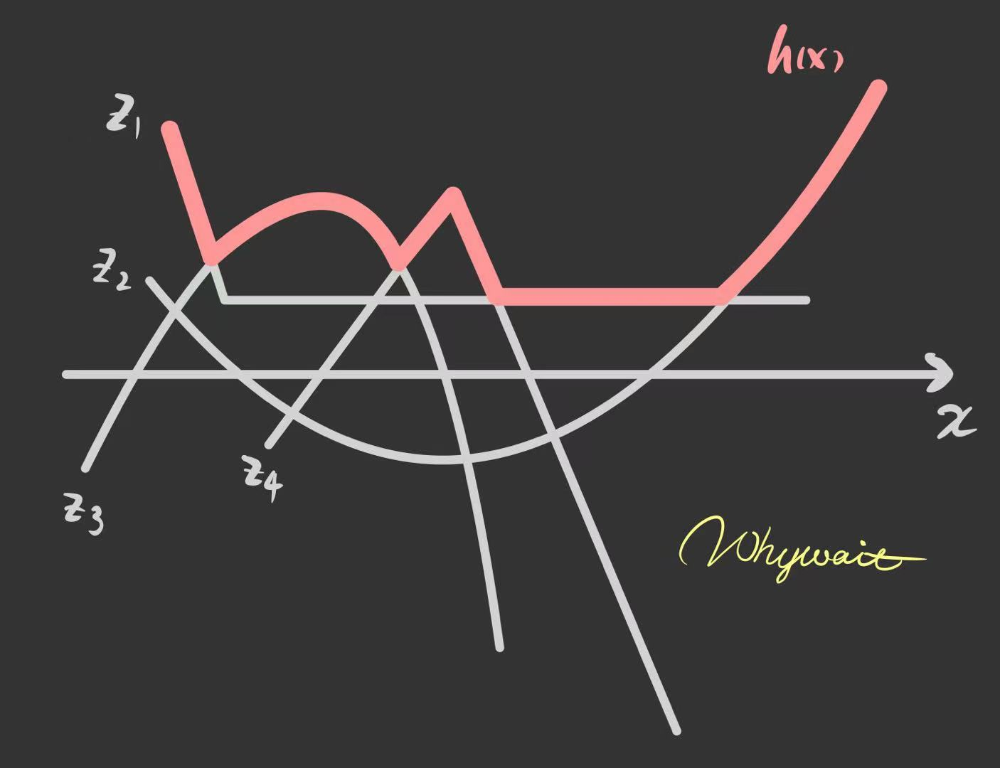

## GELU
[Gaussian error linear units (gelus)](https://arxiv.org/pdf/1606.08415) 2016
$$ \begin{align}
\text{GELU}(x) & = x P(X \leq x) = x \Phi (x) = x \cdot \frac{1}{2} \left[ 1 + \text{erf}(x/\sqrt{2})\right] \\
& \approx 0.5x \left\{ 1 + \text{tanh}\left[ \sqrt{2/\pi} \left( x + 0.044715 x^3 \right) \right] \right\} \\
& \approx x \sigma (1.702x)
\end{align}$$
我们可以使用不同的累积分布函数(CDF) $\Phi (x)$。例如, 我们可以使用 Logistic 分布的 CDF $\sigma(x)$, 得到我们称之为 Sigmoid Linear Unit (SiLU) 的函数 $x\sigma(x)$。我们还可以使用 $N(\mu, \sigma^2)$ 的 CDF $\Phi (x) = \frac{1}{2} \left[ 1 + \text{erf}\left( \frac{x - \mu}{\sigma\sqrt{2}} \right))\right]$, 并让 $\mu$ 和 $\sigma$ 成为可学习的超参数, 但在本研究中, 我们简单地令 $\mu = 0$ 和 $\sigma = 1$。

优点:
1. GeLU 具有平滑非线性
2. 在 Transformer 模型中广泛应用于 FFN 块
3. 几乎没有梯度消失的现象, 可以更好地支持深层神经网络的训练和优化

缺点:
1. 幂运算的计算复杂度比 ReLU 高, 会增加计算时间

## Swish
[SWISH: A SELF-GATED ACTIVATION FUNCTION](https://arxiv.org/pdf/1710.05941v1) 2017
$$ f(x) = x \cdot \sigma(x) $$
其中 $ \sigma(x) = (1 + \text{exp}(-x))^{-1} $ 是 sigmoid 函数

像 ReLU 一样, Swish 是上无界且下有界的。与 ReLU 不同, Swish 是平滑且非单调的。事实上, Swish 的非单调性使其区别于大多数常见的激活函数。Swish 的导数如下:
$$ \begin{align}
f^{'}(x) & = \sigma(x) + x \cdot \sigma(x) \left(1 - \sigma(x) \right) \\
& = \sigma(x) + x \cdot \sigma(x) - x \cdot \sigma(x)^2 \\
& = x \cdot \sigma(x) + \sigma(x) \left( 1 - x \cdot \sigma(x) \right) \\
& = f(x) + \sigma(x) \left(1 - f(x) \right) \\
\end{align} $$

Swish 函数的一阶和二阶导数如图 2 所示。对于输入小于约 1.25, 导数的绝对值小于 1。Swish 的成功表明, ReLU 的梯度保持特性(即当$x > 0$ 时导数为 1)在现代架构中可能不再是一个显著的优势。实际上, 我们在实验部分展示了使用 BatchNorm(Ioffe & Szegedy, 2015)时, 可以训练比 ReLU 网络更深的 Swish 网络。

如果对 Swish 进行如下轻微的重参数化, 则可以看到与 ReLU 的额外联系:
$$f(x, \beta) = 2x \cdot \sigma(\beta x)$$
如果$\beta = 0$，Swish 变为线性函数$f(x) = x$。当$\beta \to \infty$, sigmoid 函数趋近于 0-1 函数, 因此 Swish 变得类似于 ReLU 函数。这表明, Swish 可以被松散地视为一个平滑的函数, 它非线性地插值于线性函数和 ReLU 函数之间。如果$\beta$被设为一个可训练的参数, 插值的程度被模型控制。我们称这个变体(不带因子 2)为 $\text{Swish}-\beta$。

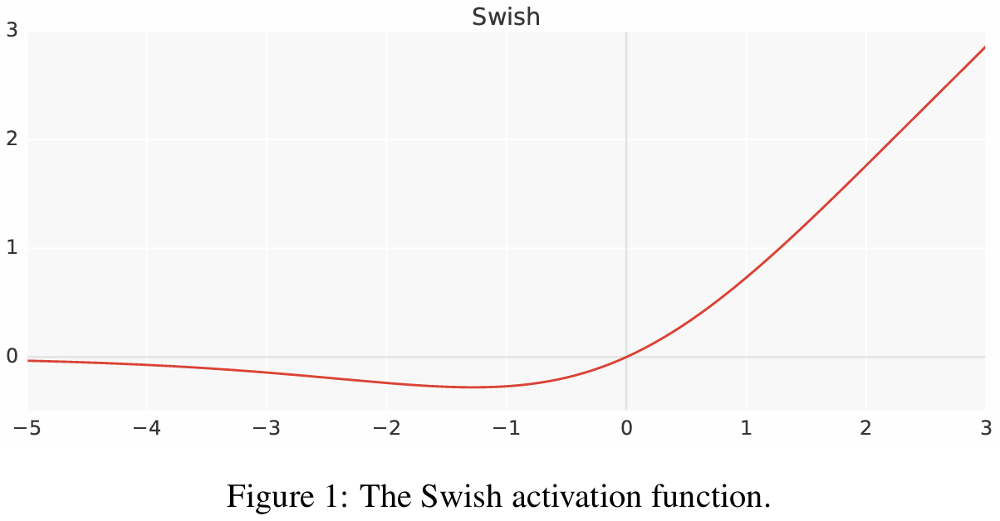
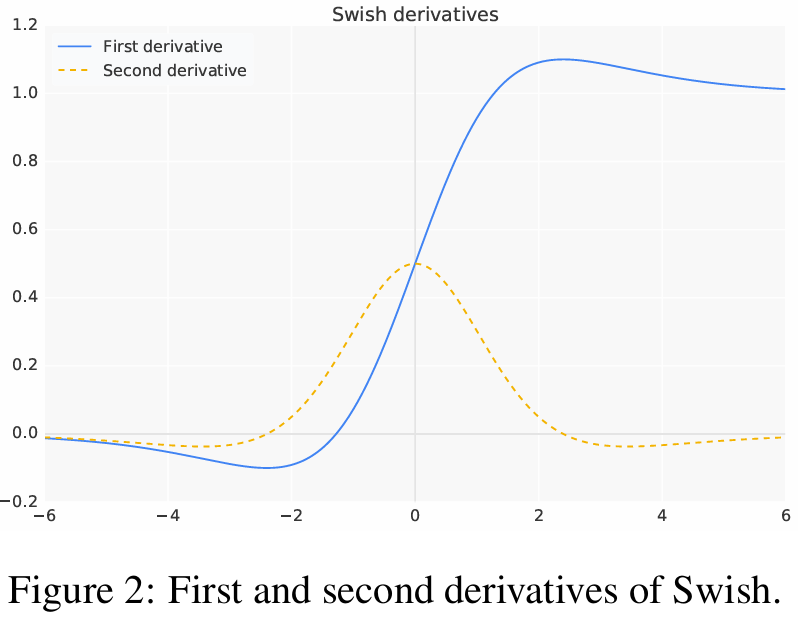

优点: 
1. 平滑非单调, 可以带来更好优化和更快的收敛
2. 无上界有下界
3. 虽然比ReLU复杂, 但仍可以通过现有的 Sigmoid 实现高效计算
4. 自门控机制, 有助于信息流动

缺点:
1. 比ReLU复杂, 可能会略微增加训练时间
2. 非稀疏激活: 不像ReLU那样产生稀疏激活, 这在某些任务中可能是不利的

## GLU
[Language Modeling with Gated Convolutional Networks](https://proceedings.mlr.press/v70/dauphin17a/dauphin17a.pdf) 2016 [arXiv](https://arxiv.org/pdf/1612.08083v1)

在本文中, 我们介绍了一种新的神经语言模型, 该模型采用门控时序卷积替代递归网络中常用的递归连接。神经语言模型(Bengio 等，2003)为每个单词 $w_0, \dots, w_N$ 生成上下文的表示 $H = \left[ h_0, \dots, h_N \right]$ 来预测下一个单词 $𝑃(w_i | h_i)$。递归神经网络 $f$ 通过一个递归函数$h_i = f(h_{i-1}, w_{i-1})$ 计算 $H$, 这本质上是一个顺序过程, 无法在 $i$ 上并行化。

我们提出的方法通过一个函数 $f$ 对输入进行卷积得到 $ H = f * w $, 因此没有时间依赖性, 从而在句子的每个单词上更容易地进行并行化。这个过程将每个上下文计算为若干前置单词的函数。与递归网络相比, 上下文的大小是有限的, 但我们将证明无限上下文并不是必需的, 而且我们的模型可以表示足够大的上下文, 在实践中表现良好。

图 1 展示了模型架构。单词通过存储在查找表$D^{|\mathscr{V}|\times e}$中的向量嵌入表示, 其中 $|\mathscr{V}|$ 是词汇表中的单词数量, $e$ 是嵌入维度。我们模型的输入是一系列单词 $w_0, \dots, w_N$, 它们通过词嵌入$E = \left[ D_{w_0}, \dots, D_{w_N}\right]$表示。我们计算隐含层 $h_0, \dots, h_L$
$$h_l(X) = (X * W + b)\otimes \sigma(X * V + c)$$
其中 $m, n$ 分别是输入和输出 featuremaps 的数量, $k$ 是 patch 大小, $X \in \mathbb{R}^{N \times m}$ 是 $h_l$ 层的输入(单词嵌入或前一层的输出), $W \in \mathbb{R}^{k \times m \times n}, b \in \mathbb{R}^n, V \in \mathbb{R}^{k \times m \times n}, c \in \mathbb{R}^n$ 是学习的参数, $\sigma$ 是 sigmoid 函数, $\otimes$ 是矩阵之间的逐元素乘积。

在对输入进行卷积时, 我们确保 $h_i$ 不包含未来单词的信息。为了解决这个问题, 我们通过移动卷积输入, 以防止卷积核看到未来的上下文(Oord et al., 2016a)。具体来说, 我们在序列的开头用 $k - 1$ 个元素进行零填充, 假设第一个输入元素是序列标记的开始, 我们不对其进行预测, $k$ 是卷积核的宽度。

每一层的输出是线性投影 $X * W + b$ 按元素乘以门控 $\sigma(X * V + c)$。类似于 LSTMs, 这些门控对矩阵 $X * W + b$ 的每个元素进行乘法, 并控制在层结构中传递的信息。我们将这一门控机制称为门控线性单元(Gated Linear Units, GLU)。在输入 $E$ 之上堆叠多个层, 给出每个单词的上下文表示 $H = h_L \circ \dots \circ h_0(E)$。我们将卷积和门控线性单元封装在一个预激活残差块中, 它将块的输入添加到输出(He et al., 2015a)。这些块具有瓶颈结构以提高计算效率, 且每个块最多可以包含 5 层。

--------

由 Microsoft 团队在 2016 年提出, 为解决 LSTM 序列计算前后依赖不能很好并行问题, GLU 是在 CONV 基础上加入 Gate 结构, 可以实现 stack 堆叠, 效果比 LSTM 更好。GLU 的核心思想是通过**门控机制**过滤信息, 进而提高网络的表达能力和泛化能力。门控机制有助于长距离建模。

## SwishGLU
paper: [GLU Variants Improve Transformer](https://arxiv.org/pdf/2002.05202.pdf)
$$ \begin{align}
\text{GLU}(x,W,V,b,c) & = \sigma (xW +b) & \otimes (xV +c) \\
\text{Bilinear}(x,W,V,b,c) & = (xW +b) & \otimes (xV +c) \\
\text{ReGLU}(x,W,V,b,c) & = \max(0, xW +b) & \otimes (xV +c) \\
\text{GEGLU}(x,W,V,b,c) & = \text{GELU} (xW +b) & \otimes (xV +c) \\
\text{SwiGLU}(x,W,V,b,c, \beta) & = \text{Swish}_{\beta}(xW +b) & \otimes (xV +c) \\
\end{align} $$

优点:
1. **复杂的非线性**: Swish部分提供了一种平滑、非单调的激活, 能够捕捉复杂的非线性关系。
2. **自适应门控机制**: GLU 部分引入了一种动态的、输入依赖的门控机制, 可以根据输入的情况决定哪些信息应该通过、哪些信息应该被过滤。这对于**处理长序列、长距离依赖的文本**特别有用。
3. **梯度稳定性**: Swish 在整个定义域上都有非零梯度, 而 GLU 也具有良好的梯度流动性, SwiGLU 在反向传播过程中能够保持稳定的梯度流, 有助于缓解深度网络中的梯度消失问题
4. **可学习参数**: 使得模型可以根据不同任务和数据集动态调整这些参数, 增强了模型的灵活性和适应性。

缺点: 
1. 计算复杂度高: 比单一的激活函数(如ReLU或Swish)计算复杂度更高, 可能会显著增加训练和推理时间
2. 参数增加: GLU 部分引入了额外的可学习参数(GLU部分的权重和偏置), 增加了模型的复杂度和内存使用

## Softmax
一般用于多类分类问题的激活函数
$$ \left[ \begin{matrix} 1.3 \\ 5.1 \\ 2.2 \\ 0.7 \\ 1.1 \end{matrix} \right] \to \frac{e^{z_i}}{\sum_{j=1}^K e^{z_j}} \to \left[ \begin{matrix} 0.02 \\ 0.90 \\ 0.05 \\ 0.01 \\ 0.02 \end{matrix} \right] $$
Softmax 与 max 的区别在于其不会丢弃具有较小概率的较小值

缺点:
1. 零点不可微
2. 负输入的梯度为零, 这意味着对于该区域的激活, 权重不会在反向传播期间更新, 因此会产生用不激活的死亡神经元

## 小结
| 激活函数 | 公式 | 优点 | 缺点 |
| :- | :- | :- | :- |
| Sigmoid | $$g(z) = \frac{1}{1 + e^{-z}}$$ $$\frac{d}{dz}g(z) = \frac{1}{1 + e^{-z}} \left( 1 - \frac{1}{1 + e^{-z}}\right) = g(z)(1 - g(z))$$ [详细数学分析](http://neuralnetworksanddeeplearning.com/chap5.html)  | 1. 将(-$\inf$, $\inf$)的输入特征值压缩至[0, 1], 对每个神经元的输出进行归一化, 适用于将预测概率作为输出的模型<br>2. 梯度平滑, 避免"跳跃"的输出值 | 1. **梯度消失**。sigmoid的导数都是小于0.25的，那么在进行反向传播的时候，梯度相乘结果会慢慢的趋*于0。这样，几乎就没有梯度信号通过神经元传递到前面层的梯度更新中，因此这时前面层的权值几乎没有更新<br>2. 输出不是0均值。这是不可取的, 因为这会导致后一层的神经元将得到上一层输出的非0均值的信号作为输入。 产生的一个结果就是: 如果 $x > 0,\ f = w^T x + b$, 那么对$w$求局部梯度则都为正, 这样在反向传播的过程中$w$要么都往正方向更新, 要么都往负方向更新, 导致有一种捆绑的效果, 使得收敛缓慢。当然了, 如果按 batch 去训练, 那么那个 batch 可能得到不同的信号, 所以这个问题还是可以缓解一下的。因此, 非0均值这个问题虽然会产生一些不好的影响, 不过跟上面提到的梯度消失问题相比还是要好很多的。(https://blog.csdn.net/tyhj_sf/article/details/79932893)<br>3. 幂运算耗时较高 |
| Tanh | $$\text{tanh}(z) = \frac{e^z - e^{-z}}{e^z + e^{-z}} = \frac{2}{1 + e^{-2z}} - 1 = 2 * \text{Sigmoid}(2z)-1$$ $$\frac{d}{dz} \text{tanh}(z) = 1 - \tanh^2(z)$$ | 1. 解决了 Sigmoid 函数输出不是0均值的问题<br>2. 导数取值范围在[0, 1], 优于 Sigmoid 导数取值范围的 [0, 0.25], 收敛更快 | 1. 与Sigmoid函数类似, 梯度消失问题仍然存在<br>2. 幂运算耗时问题仍然存在 |
| ReLU | Rectified Linear Unit<br>[ImageNet Classification with Deep Convolutional Neural Networks](https://proceedings.neurips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf) 2012<br>$$\text{ReLU}(z) = \begin{cases} z, \text{if } z \geq 0 \\ 0, \text{if } z < 0 \end{cases}$$ | 1. 相较于 Sigmoid 函数和 Tanh 函数, 当输入为正时, ReLU 函数不存在饱和问题, 即解决梯度消失问题<br>2. 分段线性, 计算速度快<br>3. 由于线性和非饱和, 收敛速度比 Sigmoid 和 Tanh 快<br>4. ReLU 会使一部分神经元输出为0, 在带来网络稀疏性的同时, 也减少了参数之间的关联性, 一定程度上缓解过拟合问题 | 1. ReLU 的输出也不是0均值的<br>2. **Dead ReLU 问题**。当输入为负时, 梯度将完全为零, 进而导致相应参数一直无法更新, 某些神经元可能永远不会被激活<br>3. 当输入为正时, 导数为1, 不会出现梯度消失, 但梯度的下降完全取决于权值的乘积, 可能会导致梯度爆炸问题 |
| Leaky ReLU | [Rectifier Nonlinearities Improve Neural Network Acoustic Models](https://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf) 2013<br>$$\text{Leaky ReLU}(z) = \begin{cases} z, \text{if } z \geq 0 \\ \alpha z, \text{if } z < 0 \end{cases}$$ | 1. 针对 ReLU 的 Dead ReLU 问题, Leaky ReLU 在输入为负值时, 给输入值一个很小的斜率, 解决负输入的0梯度问题, 很好地缓解了 Dead ReLU 问题<br>2. 对于所有的输入, 不管是大于等于0还是小于0, 神经元不饱和 | 1. 理论上, 该函数比 ReLU 函数效果更好, 但是大量实践表明, 其效果不稳定, 故在实际中应用不多<br>2. 引入超参数: 值的选择需要调优，增加了模型复杂度。$\alpha$ 需要通过先验知识人工赋值, 通常为0.01左右 |
| PReLU | $$\text{PReLU}(z) = \begin{cases} z, \text{if } z \geq 0 \\ \alpha z, \text{if } z < 0 \end{cases}$$<br>$\alpha$ 可学习 | 自适应斜率 | 增加模型复杂度 |
| ELU | $$\text{ELU}(z) = \begin{cases} z, \text{if } z \geq 0 \\ \alpha (e^z - 1), \text{if } z < 0 \end{cases}$$ | 1. ELU 具有 ReLU 的大多数优点, 不存在 Dead ReLU 问题<br>2. 通过减少偏置偏移的影响, 使正常梯度更接近于单位自然梯度, 从而使均值向零加速学习<br>3. 在较小的输入下会饱和至负值, 从而减少前向传播的变异和信息 | 1. 幂运算耗时高<br>2. 在实践中, 同样没有像 ReLU 一样优秀的效果, 故应用不多 |
| SELU | $$\text{SELU}(z) = \begin{cases} \lambda z, \text{if } z \geq 0 \\ \lambda \alpha (e^z - 1), \text{if } z < 0 \end{cases}$$ | 自归一化 | 使用条件严格 |
| Maxout | Maxout 出自 maxout networks (ICML2013), 作者 Goodfellow 将 maxout 和 dropout 结合, 在MNIST、CIFAR-10、CIFAR-100、SVHN这4个数据集上都取得了 start-of-art 的识别率<br>$$f_i(x) = \max_{j\in [1, k]} z_{ij} $$ $$z_{ij} = x^T W_{ij} + b_{ij}$$ | 1. Maxout 具有 ReLU 和 Leaky ReLU 的所有优点: 线性、不饱和性<br>2. 同时没有 ReLU 的一些缺点, 如: 神经元的死亡<br>3. Maxout 的拟合能力非常强, 它可以拟合任意的凸函数, Goodfellow 在论文中从数学的角度上也证明了这个结论 | 1. 从 $f(x) = \max(w_1^Tx + b_1, w_2^Tx + b_2)$ 可以看出， 每个 $neuron$ 将有两组$w$, 那么参数就增加了一倍, 这将导致整体参数的数量激增 |
| GELU | [Gaussian Error Linear Units (GELUs)](https://arxiv.org/pdf/1606.08415) 2016<br>$$\begin{align}
\text{GELU}(x) & = x P(X \leq x) = x \Phi (x) = x \cdot \frac{1}{2} \left[ 1 + \text{erf}(x/\sqrt{2})\right] \\
& \approx 0.5x \left\{ 1 + \text{tanh}\left[ \sqrt{2/\pi} \left( x + 0.044715 x^3 \right) \right] \right\} \\
& \approx x \sigma (1.702x) \\
\end{align}$$ 我们可以使用不同的累积分布函数(CDF) $\Phi (x)$。例如, 我们可以使用 Logistic 分布的 CDF $\sigma(x)$, 得到我们称之为 Sigmoid Linear Unit (SiLU) 的函数 $x\sigma(x)$。我们还可以使用 $N(\mu, \sigma^2)$ 的 CDF $\Phi (x) = \frac{1}{2} \left[ 1 + \text{erf}\left( \frac{x - \mu}{\sigma\sqrt{2}} \right))\right]$, 并让 $\mu$ 和 $\sigma$ 成为可学习的超参数, 但在本研究中, 我们简单地令 $\mu = 0$ 和 $\sigma = 1$。 | 1. GeLU 具有平滑非线性<br>2. 在 Transformer 模型中广泛应用于 FFN 块<br>3. 几乎没有梯度消失的现象, 可以更好地支持深层神经网络的训练和优化 | 1. 幂运算的计算复杂度比 ReLU 高, 会增加计算时间 |
| Swish | [SWISH: a Self-Gated Activation Function](https://arxiv.org/pdf/1710.05941v1) 2017 $$f(x) = x \cdot \sigma(x)$$ 其中 $ \sigma(x) = (1 + \text{exp}(-x))^{-1} $ 是 sigmoid 函数<br><br>像 ReLU 一样, Swish 是上无界且下有界的。与 ReLU 不同, Swish 是平滑且非单调的。事实上, Swish 的非单调性使其区别于大多数常见的激活函数。Swish 的导数如下: $$ \begin{align}
f^{'}(x) & = \sigma(x) + x \cdot \sigma(x) \left(1 - \sigma(x) \right) \\
& = \sigma(x) + x \cdot \sigma(x) - x \cdot \sigma(x)^2 \\
& = x \cdot \sigma(x) + \sigma(x) \left( 1 - x \cdot \sigma(x) \right) \\
& = f(x) + \sigma(x) \left(1 - f(x) \right) \\
\end{align}$$ Swish 函数的一阶和二阶导数如图 2 所示。对于输入小于约 1.25, 导数的绝对值小于 1。Swish 的成功表明, ReLU 的梯度保持特性(即当$x > 0$ 时导数为 1)在现代架构中可能不再是一个显著的优势。实际上, 我们在实验部分展示了使用 BatchNorm(Ioffe & Szegedy, 2015)时, 可以训练比 ReLU 网络更深的 Swish 网络。<br><br>如果对 Swish 进行如下轻微的重参数化, 则可以看到与 ReLU 的额外联系: $$f(x, \beta) = 2x \cdot \sigma(\beta x)$$ 如果$\beta = 0$，Swish 变为线性函数$f(x) = x$。当$\beta \to \infty$, sigmoid 函数趋近于 0-1 函数, 因此 Swish 变得类似于 ReLU 函数。这表明, Swish 可以被松散地视为一个平滑的函数, 它非线性地插值于线性函数和 ReLU 函数之间。如果$\beta$被设为一个可训练的参数, 插值的程度被模型控制。我们称这个变体(不带因子 2)为 $\text{Swish}-\beta$。<br><br>**GELU vs Swish**: 函数形式和性质相似, 前者是固定系数 1.702, 后者是可变系数 $\beta$, 两者的实际应用表现也相差不大。|1. 平滑非单调, 可以带来更好优化和更快的收敛<br>2. 无上界有下界<br>3. 虽然比ReLU复杂, 但仍可以通过现有的 Sigmoid 实现高效计算<br>4. 自门控机制, 有助于信息流动 | 1. 比ReLU复杂, 可能会略微增加训练时间<br>2. 非稀疏激活: 不像ReLU那样产生稀疏激活, 这在某些任务中可能是不利的 |
| GLU | Gated Linear Unit<br>[Language Modeling with Gated Convolutional Networks](https://proceedings.mlr.press/v70/dauphin17a/dauphin17a.pdf) 2016 [arXiv](https://arxiv.org/pdf/1612.08083v1)<br><br>在本文中, 我们介绍了一种新的神经语言模型, 该模型采用门控时序卷积替代递归网络中常用的递归连接。神经语言模型(Bengio 等，2003)为每个单词 $w_0, \dots, w_N$ 生成上下文的表示 $H = \left[ h_0, \dots, h_N \right]$ 来预测下一个单词 $𝑃(w_i | h_i)$。递归神经网络 $f$ 通过一个递归函数$h_i = f(h_{i-1}, w_{i-1})$ 计算 $H$, 这本质上是一个顺序过程, 无法在 $i$ 上并行化。<br><br>我们提出的方法通过一个函数 $f$ 对输入进行卷积得到 $ H = f * w $, 因此没有时间依赖性, 从而在句子的每个单词上更容易地进行并行化。这个过程将每个上下文计算为若干前置单词的函数。与递归网络相比, 上下文的大小是有限的, 但我们将证明无限上下文并不是必需的, 而且我们的模型可以表示足够大的上下文, 在实践中表现良好。<br><br>图 1 展示了模型架构。单词通过存储在查找表$D^{|\mathscr{V}|\times e}$中的向量嵌入表示, 其中 $|\mathscr{V}|$ 是词汇表中的单词数量, $e$ 是嵌入维度。我们模型的输入是一系列单词 $w_0, \dots, w_N$, 它们通过词嵌入$E = \left[ D_{w_0}, \dots, D_{w_N}\right]$表示。我们计算隐含层 $h_0, \dots, h_L$ $$h_l(X) = (X * W + b)\otimes \sigma(X * V + c)$$ 其中 $m, n$ 分别是输入和输出 featuremaps 的数量, $k$ 是 patch 大小, $X \in \mathbb{R}^{N \times m}$ 是 $h_l$ 层的输入(单词嵌入或前一层的输出), $W \in \mathbb{R}^{k \times m \times n}, b \in \mathbb{R}^n, V \in \mathbb{R}^{k \times m \times n}, c \in \mathbb{R}^n$ 是学习的参数, $\sigma$ 是 sigmoid 函数, $\otimes$ 是矩阵之间的逐元素乘积。<br><br>在对输入进行卷积时, 我们确保 $h_i$ 不包含未来单词的信息。为了解决这个问题, 我们通过移动卷积输入, 以防止卷积核看到未来的上下文(Oord et al., 2016a)。具体来说, 我们在序列的开头用 $k - 1$ 个元素进行零填充, 假设第一个输入元素是序列标记的开始, 我们不对其进行预测, $k$ 是卷积核的宽度。<br><br>每一层的输出是线性投影 $X * W + b$ 按元素乘以门控 $\sigma(X * V + c)$。类似于 LSTMs, 这些门控对矩阵 $X * W + b$ 的每个元素进行乘法, 并控制在层结构中传递的信息。我们将这一门控机制称为门控线性单元(Gated Linear Units, GLU)。在输入 $E$ 之上堆叠多个层, 给出每个单词的上下文表示 $H = h_L \circ \dots \circ h_0(E)$。我们将卷积和门控线性单元封装在一个预激活残差块中, 它将块的输入添加到输出(He et al., 2015a)。这些块具有瓶颈结构以提高计算效率, 且每个块最多可以包含 5 层。 | 由 Microsoft 团队在 2016 年提出, 为解决 LSTM 序列计算前后依赖不能很好并行问题, GLU 是在 CONV 基础上加入 Gate 结构, 可以实现 stack 堆叠, 效果比 LSTM 更好。GLU 的核心思想是通过**门控机制**过滤信息, 进而提高网络的表达能力和泛化能力。门控机制有助于长距离建模。|
| SwishGLU | [GLU Variants Improve Transformer](https://arxiv.org/pdf/2002.05202.pdf) $$ \begin{align}
\text{GLU}(x,W,V,b,c) & = \sigma (xW +b) & \otimes (xV +c) \\
\text{Bilinear}(x,W,V,b,c) & = (xW +b) & \otimes (xV +c) \\
\text{ReGLU}(x,W,V,b,c) & = \max(0, xW +b) & \otimes (xV +c) \\
\text{GEGLU}(x,W,V,b,c) & = \text{GELU} (xW +b) & \otimes (xV +c) \\
\text{SwiGLU}(x,W,V,b,c, \beta) & = \text{Swish}_{\beta}(xW +b) & \otimes (xV +c) \\
\end{align} $$ | 1. **复杂的非线性**: Swish部分提供了一种平滑、非单调的激活, 能够捕捉复杂的非线性关系<br>2. **自适应门控机制**: GLU 部分引入了一种动态的、输入依赖的门控机制, 可以根据输入的情况决定哪些信息应该通过、哪些信息应该被过滤。这对于**处理长序列、长距离依赖的文本**特别有用<br>3. **梯度稳定性**: Swish 在整个定义域上都有非零梯度, 而 GLU 也具有良好的梯度流动性, SwiGLU 在反向传播过程中能够保持稳定的梯度流, 有助于缓解深度网络中的梯度消失问题<br>4. **可学习参数**: 使得模型可以根据不同任务和数据集动态调整这些参数, 增强了模型的灵活性和适应性 | 1. 计算复杂度高: 比单一的激活函数(如ReLU或Swish)计算复杂度更高, 可能会显著增加训练和推理时间<br>2. 参数增加: GLU 部分引入了额外的可学习参数(GLU部分的权重和偏置), 增加了模型的复杂度和内存使用 |
| Softmax | $$ \left[ \begin{matrix} 1.3 \\ 5.1 \\ 2.2 \\ 0.7 \\ 1.1 \end{matrix} \right] \to \frac{e^{z_i}}{\sum_{j=1}^K e^{z_j}} \to \left[ \begin{matrix} 0.02 \\ 0.90 \\ 0.05 \\ 0.01 \\ 0.02 \end{matrix} \right] $$ | 1. 一般用于多类分类问题的激活函数<br>2. Softmax 与 max 的区别在于: 其不会丢弃具有较小概率的较小值 | 1. 零点不可微<br>2. 负输入的梯度为零, 这意味着对于该区域的激活, 权重不会在反向传播期间更新, 因此会产生用不激活的死亡神经元 |

## Softplus
$$g(z)=\ln (1+e^z) $$
其导数为
$$g^{'}(z) = \frac{e^z}{1+e^z} = \frac{1}{1 + e^{-z}}$$
也称为 logistic / sigmoid 函数

Softplus 函数类似于 ReLU 函数, 但是相对较平滑, 像 ReLU 一样是左饱和

**Note**: Softmax 建模使用的分布是多项式分布, 而logistic则基于伯努利分布。多个 logistic 回归通过叠加也同样可以实现多分类的效果, 但是 softmax 回归进行的多分类, 类与类之间是互斥的, 即一个输入只能被归为一类; 多个logistic回归进行多分类, 输出的类别并不是互斥的, 即"苹果"这个词语既属于"水果"类也属于"3C"类别。 


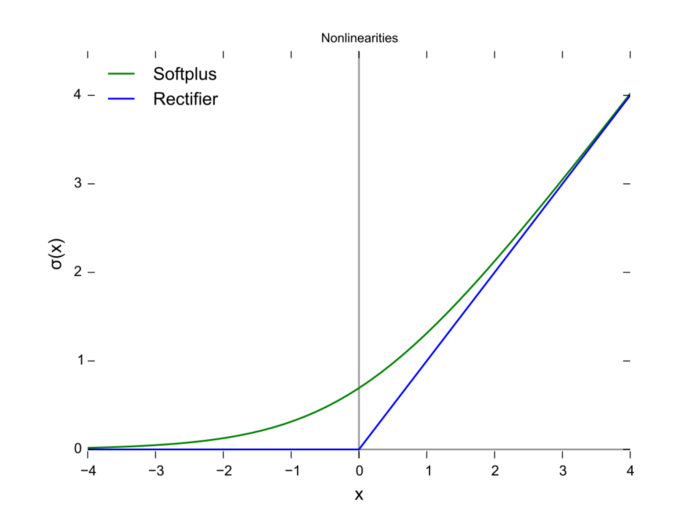

# Normalization
1. 降低数据的量纲差异, 使得求最优解的过程变得平缓, 可以更快速的收敛到最优解, 示例演示参见https://paddlepedia.readthedocs.io/en/latest/tutorials/deep_learning/normalization/basic_normalization.html#id4
2. 归一化有助于使模型更好地泛化到未见过的数据。当输入数据归一化后, 模型在训练过程中能够更好地学习到数据的统计特性, 从而提高其对新数据的适应能力。

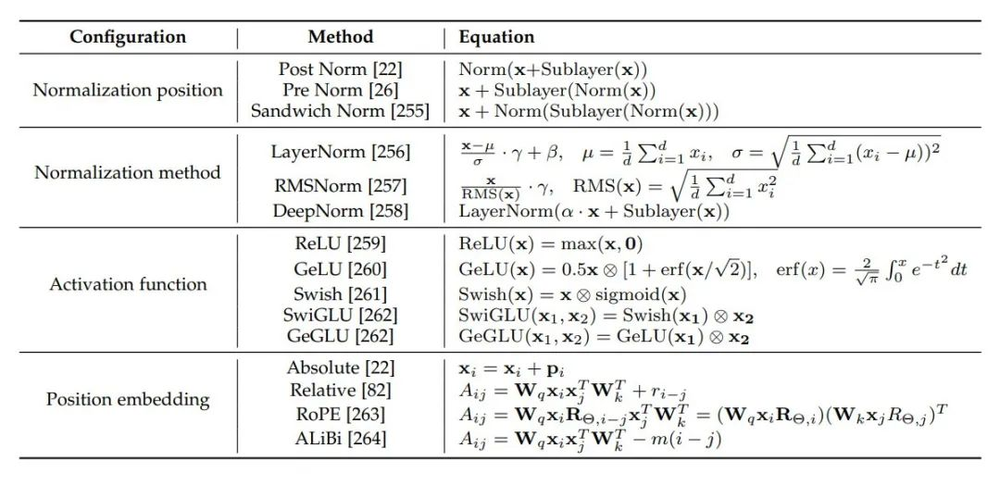
来自论文: [A Survey of Large Language Models](https://arxiv.org/pdf/2303.1822)

## Post-Norm vs Pre-Norm
| | Post-Norm | Pre-Norm |
| :- | :- | :- |
| 位置 | 在 Add 后进行 Norm<br>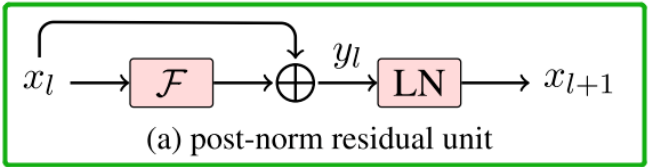<br>refer to: https://53ai.com/news/LargeLanguageModel/2024080656791.html | Norm 之后再 Add<br>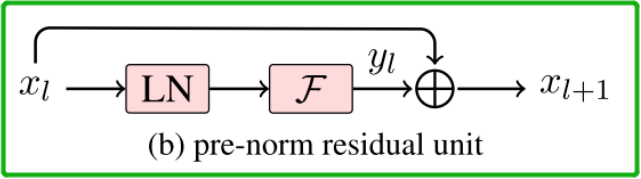 |
| | 对所有的参数都进行归一化, 对参数正则化的效果更强, 进而模型的鲁棒性会更好, 但 Post Norm 在训练过深的模型时, 梯度在计算回传的时候容易发生梯度消失或梯度爆炸。<br>(不易训练) | 对部分参数进行归一化, 部分参数直接加在后面(没有正则化), 这样可以防止模型发生梯度消失或者梯度爆炸, 模型训练的稳定性更强<br>(易训练) |
| 层数 | 在层数较少时, Post Norm 和 Pre Norm 都能正常收敛的情况下, Post Norm 的效果更好一些 | 在层数较多时, 为保证模型训练，可以选择 Pre Norm | 
| warm-up | 如果 Post Norm 结构的模型不进行 warm-up, 能观察到的现象往往是: loss 快速收敛到一个常数附近, 然后再训练一段时间, loss开始发散, 直至NAN。<br>如果进行 warm-up, 抑制了后面层的学习速度, 并且给前面层更多的优化时间 | Pre Norm 结构的模型, 没有明显的梯度消失现象, 不加 warm-up 往往也可以成功训练 |
| learning rate schedular | Post-Norm 必须要使用 warm-up 策略才可以在数据集上取得较好的Loss和BLEU结果 | Pre-Norm 不需要采用warm-up策略 |
| 收敛速度 | | 由于 Pre-Norm 不采用warm-up, 其一开始的 learning rate 比 Post-Norm 更高, 因此它的收敛速度更快 |
| 超参调整 | warm-up 策略带来两个需要调整的参数: lr(最大学习率)和T(warm-up 过程的总步数)。这两个参数的调整将会影响模型最终的效果。由于引入超参吗, 也给模型训练带来一定难度 | |
| gradient norm | 输出层的 gradient norm 较大, 且越往下层, gradient norm 呈现下降趋势。这种情况下, 如果在训练初期采用一个较大的学习率, 容易引起模型的震荡 | 输出层的 gradient norm 较小, 且不随层数递增或递减而变动, 保持稳定 |

## Min-Max normalization
$$ X^{'} = \frac{X - X_{\text{min}}}{X_{\text{max}} - X_{\text{min}}} $$

优点:
1. 归一化后的数据范围为[0, 1]
2. 对于有界数据和需要保持分布形状的场景效果很好。

缺点:
1. 归一化过程与最大值和最小值有关, 容易受到极端值(outliers)的影响, 可能导致缩放后的数据失去重要信息
2. 不适合在最大最小值不明确的情况

## Mean normalization
$$ X^{'} = \frac{X - X_{\text{mean}}}{X_{\text{max}} - X_{\text{min}}} $$
归一化后的数据范围为[-1, 1]

缺点:
1. 不适合在最大最小值不明确的情况

## Z-score normalization
$$ X^{'} = \frac{X - \mu}{\sigma}$$
其中, $\mu$ 是均值, $\sigma$ 是标准差。

优点:
1. 不受异常值影响, 适合于正态分布的数据。
2. 数据的均值为 0, 方差为 1, 适合用于许多机器学习算法(如 SVM、KNN)。

缺点:
1. 对于非正态分布数据，可能会导致模型效果不佳。
2. 对于小样本数据，均值和标准差的估计可能不稳定。

## L2 normalization
$$ X^{'} = \frac{X}{\left\| X \right\|_2}$$
其中, $\left\| X \right\|_2$ 是向量的 L2 范数。

优点：
1. 保持数据的相对距离, 适用于需要计算相似度的算法(如 KNN)。
2. 适合文本数据和高维数据。

缺点:
1. 不适合处理稀疏数据(如文本分类中的词频矩阵)。

## L1 normalization
$$ X^{'} = \frac{X}{\left\| X \right\|_1}$$
其中, $\left\| X \right\|_1$ 是向量的 L1 范数。

优点:
1. 使得数据稀疏, 适合特征选择。
2. 对异常值的影响较小。

缺点:
1. 可能会导致信息损失, 尤其是在特征间相关性较强的情况下。

## Robust normalization
$$ X^{'} = \frac{X - \text{median}(X)}{\text{IQR}(X)}$$
其中, $\text{IQR}$ 是四分位距(Interquartile Range)

优点:
1. 对异常值有很强的鲁棒性, 适合含有离群点的数据集。

缺点:
1. 计算较为复杂, 可能不够直观。

## 对数归一化
$$X^{′}=\frac{\lg X}{\lg \max(X)}$$
## 反正切函数归一化
$$X^{′} = \arctan(X) \cdot \frac{2}{\pi}$$
归一化后的数据范围为 [-1, 1]

# Transformer VS LLaMA

| | Transformer | LLaMA2 |
| :- | :- | :- |
| 模型结构 | 编码器(encoder)和解码器(decoder) | 仅解码器(decoder-only) |
| 归一化 | **层标准化(LayerNorm)** | **均方根标准化(Root Mean Square Layer Normalization, RMSNorm)** |
| | [Layer Normalization](https://arxiv.org/pdf/1607.06450) | [Root Mean Square Layer Normalization](https://arxiv.org/pdf/1910.07467) |
| | $$\mu = \frac{1}{H} \sum_{i=1}^H x_i,\ \sigma = \sqrt{\frac{1}{H} \sum_{i=1}^H (x_i - \mu)^2},\ N(\mathbf{x}) = \frac{\mathbf{x} - \mu}{\sigma},\ \mathbf{h} = g\odot N(x) + b$$<br>$\mathbf{x} = (x_1,x_2,\cdots, x_H)$ 表示某个时间步 LayerNorm 层的输入向量表示; 输入向量维度为$H$; $\mathbf{h}$ 是 LayerNorm 层的输出; $g, b$ 是两个可学习的参数 | $$ \text{RMS}(\mathbf{x}) = \sqrt{\frac{1}{H} \sum_{i=1}^H x_i^2 }, \bar{x_i} = \frac{x_i}{\text{RMS}(\mathbf{x})} g_i$$ |
| | 1.**平移不变性**(re-centering)和**缩放不变性**(re-scaling) | 1. **缩放不变性**(re-scaling) |
| | | 仅使用 $\mathbf{x}$ 的均方根对输入进行归一化, 去掉了均值计算, 同时移除平移偏置$b$。RMSNorm 作者通过实验证明, re-centering 不是必需的, Layer Norm 的计算简化, 降低 7%-64% 的计算耗时 |
| | 2.**Post-Norm**: 在神经网络的某一层中, 对输入数据进行归一化处理, 通常是在激活函数之前进行<br>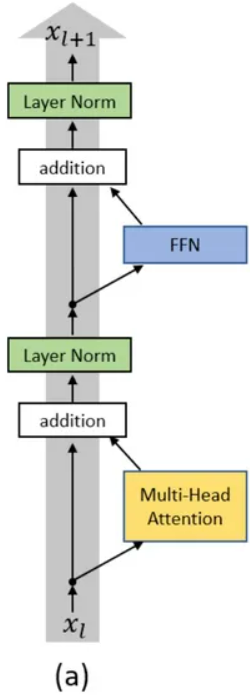<br>refer to: https://www.cnblogs.com/heyjjjjj/p/17488423.html | 2.**Pre-Norm**: 对每个 transformer 层的输入进行归一化, 而不是对输出进行归一化<br>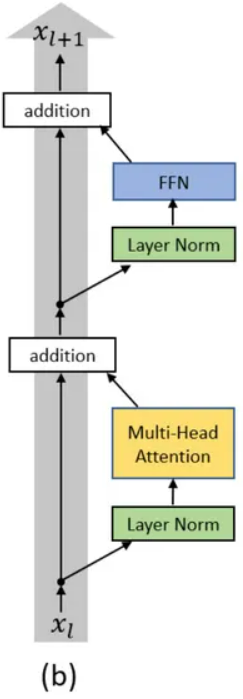 |
| | 3.针对单个训练样本进行, 不依赖于其他样本数据, 避免了 Batch Normalization 受 mini-batch 数据分布影响的问题, 同时不需要保存 mini-batch 的均值和方差, 节省了存储空间<br>**Batch Norm vs Layer Norm**:<br>Batch Norm 认为相同维的特征具有相同分布, 在特征维度上开展归一化操作, 归一化的结果保持样本之间的可比较性;<br>Layer Norm 认为每个样本内的特征具有相同分布, 因此对每一个样本进行归一化处理, 保持相同样本内部不同对象的可比较性<br>**不使用 Batch Norm 的原因**:<br>NLP 数据中由于每条样本可能不一样长, 会使用 padding, 如果对 padding 部分进行 normalization, 对效果有负面影响 | |
| | 4. 减少**内部协变量偏移**(Internal Covariate Shift): 有助于保持每一层输出的均值和方差稳定, 使梯度的传播更加稳定, 减少梯度消失或梯度爆炸问题, 提高梯度在网络中的流动性, 加快训练速度<br>**内部协变量偏移**: 指在深度神经网络的训练过程中, 每一层输入的分布会发生变化, 导致网络的训练变得困难| 4.同左 |
| | 5. 减少网络对训练数据分布的依赖, 降低过拟合的风险, 从而提高模型的泛化能力 | |
| 注意力机制 | **多头注意力(Multi-Head Attention)**<br>QKV 三部分具有相等数量的“头”, 并且它们之间是一一对应的。每一次计算注意力时, 各个头部的 QKV 独立执行自己的计算, 最后将所有头部的结果加在一起作为输出 | **多查询注意力(MQA)**(LLama, LLama2 7B, LLama2 13B)<br>MQA保持了原来的 Query 头数, 但是所有的 Query 头部都共享同一个 K 和 V 组合, 因此得名为“多查询”。据实验发现, 这种机制通常可以提高30%-40%的吞吐量, 对性能的影响相对较小。MQA是一种多查询注意力的变体, 被广泛用于自回归的解码。与MHA不同, MQA 让所有的头部在 K 和 V 之间实现共享, 每个头部只保留一份 Query 参数，从而大大降低了 K 和 V 矩阵的参数量<br><br>**分组查询注意力(GQA)**(LLama2 34B, LLama2 70B, LLama3 8B, LLama3 70B)<br>综合了 MHA 和 MQA, 既避免了过多的性能损失, 又能够利用 MQA 的推理加速。GQA 把查询头分成G组，每个组内部的头部共享一个相同的K和V组合。<br>当 G 设为1, 则所有 Query 都共享同一组 K 和 V, 这时的 GQA 等效于 MQA; 而当 G 等于头的数量, 那么这时的 GQA 等效于 MHA |
| | | todo: wq,wk,wv三个线性层分别用于生成query,key和value。采用ColumnParallelLinear实现分布并行。<br>wo线性层对多头attention的输出做融合,采用RowParallelLinear实现分布并行。<br>cache_k和cache_v用于缓存key和value,加速自注意力的计算。<br>并行线性层的使用以及caching机制,可以加速自注意力在大batch大小场景下的训练和推理。<br>整体设计实现了高效的分布式并行自注意力计算,可以扩展到大规模多GPU/机器环境,处理长序列任务。|
| 激活函数 | **ReLU** | **SwiGLU** |
| | FFN模块<br>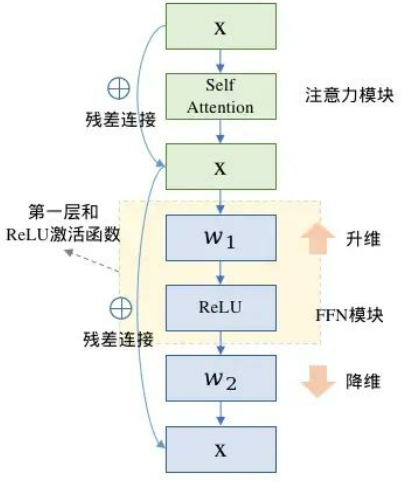<br>refer to: https://53ai.com/news/LargeLanguageModel/2024080656791.html | 带有SwiGLU的FFN模块<br>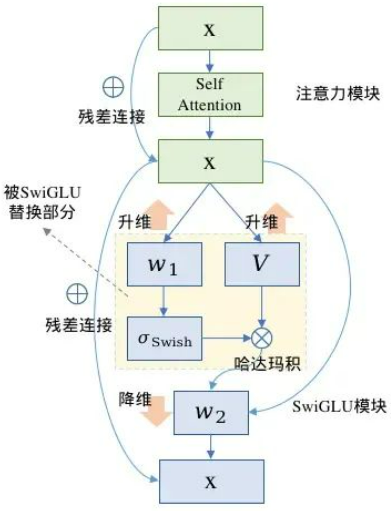 |
| | | 全连接层使用带有 SwiGLU 激活函数的Feed-Forward Network<br>$\text{FFN}_\text{SwiGLU}(x, W_1, V, W_2) = \text{SwiGLU}(x, W_1, V)W_2$<br>$\text{SwiGLU}(x, W_1, V) = \text{Swish}_{\beta}(xW_1)\otimes xV$<br>$\text{Swish}_{\beta}(x) = x \cdot \text{Sigmoid}(\beta x)$<br>在LLaMA2-7B中, FFN的原始输入维度为4096, 一般而言中间层是输入维度的4倍, 即16384。 由于 SwiGLU 的原因 FFN 从2个矩阵变成3个矩阵，为了使得模型的参数量大体保持不变，中间层缩减为原来的 2/3 即 10922，进一步为了使得中间层是256的整数倍，有做了取模再还原的操作，最终中间层维度为11008。 |
| 位置编码 | Sinusoidal 绝对位置编码 | 旋转位置编码(Rotary Position Embedding, RoPE)<br>[RoFormer: Enhanced Transformer with Rotary Position Embedding](https://arxiv.org/pdf/2104.09864) |
| | 在推理中, 若超出预训练的长度, 模型的性能将会显著降低 | 通过**旋转矩阵**将一个向量旋转某个角度, 实现对该向量添加绝对位置信息<br>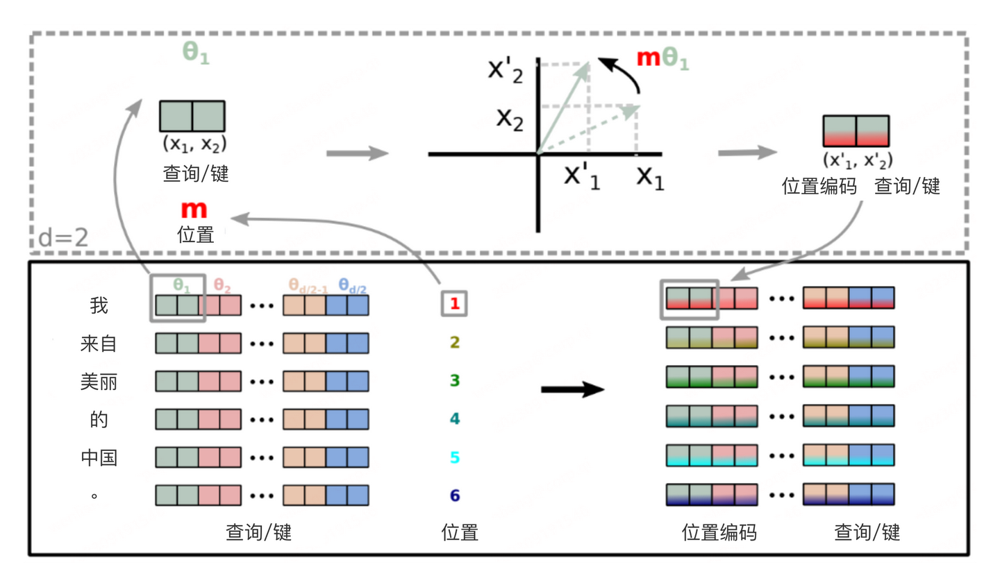<br> refer to: https://zhuanlan.zhihu.com/p/647109286 |
| | 绝对位置编码函数表示对词向量 $x_m$ 添加绝对位置信息 $m$, 即 $$ q_m = f_q(x_m, m)$$ $$ k_n = f_k(x_n, n)$$ 其中 $q_m$ 表示第 $m$ 个 token 对应的词向量 $x_m$ 集成位置信息 $m$ 之后的 query 向量, $x_m$ 表示第 $m$ 个 token 对应的 $d$ 维度词嵌入向量(embedding) | **通过绝对编码的方式实现了相对位置编码**<br>RoPE希望 $q_m$ 与 $k_n$ 之间的点积, 即 $f_q(x_m, m) \cdot f_k(x_n, n)$ 中能够带有相对位置信息 $m - n$, 只需将 $f_q(x_m, m) \cdot f_k(x_n, n)$ 表示成一个关于 $x_m, x_n, m-n$ 的函数 $g(x_m, x_n, m-n)$, 即 $$ f_q(x_m, m) \cdot f_k(x_n, n) = g(x_m, x_n, m-n) $$ 其中 $m - n$ 表示两个向量之间的相对位置信息。|
| | 绝对位置信息 $m$ 的计算方式: $$ p_{m, 2i} = \sin(\frac{m}{10000^{\frac{2i}{d}}}) $$ $$ p_{m, 2i + 1} = \cos(\frac{m}{10000^{\frac{2i}{d}}}) $$ 其中 $p_{m,2i}$ 表示 $d$ 维度位置编码向量 $m$ 中的第 $2t$ 个分量, 也就是偶数索引分量 | 假定词嵌入向量的维度是两维 $d = 2$<br>$$ \begin{align} f_q(x_m, m) & = \left[ \begin{matrix} \cos m\theta & -\sin m\theta \\ \sin m\theta & \cos m\theta \end{matrix} \right]
\left[ \begin{matrix} W_q^{(1, 1)} & W_q^{(1, 2)} \\ W_q^{(2, 1)} & W_q^{(2, 2)} \end{matrix} \right]
\left[ \begin{matrix} x_m^{(1)} \\ x_m^{(2)} \end{matrix} \right] \\ 
& = \left[ \begin{matrix} \cos m\theta & -\sin m\theta \\ \sin m\theta & \cos m\theta \end{matrix} \right]
\left[ \begin{matrix} q_m^{(1)} \\ q_m^{(2)} \end{matrix} \right]
\end{align} $$ $$ \begin{align} f_k(x_n, n) & = \left[ \begin{matrix} \cos n\theta & -\sin n\theta \\ \sin n\theta & \cos n\theta \end{matrix} \right]
\left[ \begin{matrix} W_k^{(1, 1)} & W_k^{(1, 2)} \\ W_k^{(2, 1)} & W_k^{(2, 2)} \end{matrix} \right]
\left[ \begin{matrix} x_n^{(1)} \\ x_n^{(2)} \end{matrix} \right] \\ 
& = \left[ \begin{matrix} \cos n\theta & -\sin n\theta \\ \sin n\theta & \cos n\theta \end{matrix} \right]
\left[ \begin{matrix} k_n^{(1)} \\ k_n^{(2)} \end{matrix} \right]
\end{align} $$ $$ \begin{align} & f_q(x_m, m) \cdot f_k(x_n, n) \\
= & \left( \left[ \begin{matrix} \cos m\theta & -\sin m\theta \\ \sin m\theta & \cos m\theta \end{matrix} \right] \left[ \begin{matrix} q_m^{(1)} \\ q_m^{(2)} \end{matrix} \right] \right)^T \cdot
\left( \left[ \begin{matrix} \cos n\theta & -\sin n\theta \\ \sin n\theta & \cos n\theta \end{matrix} \right] \left[ \begin{matrix} k_n^{(1)} \\ k_n^{(2)} \end{matrix} \right] \right) \\
= & \left[ \begin{matrix} q_m^{(1)} \\ q_m^{(2)} \end{matrix} \right]^T 
\left[ \begin{matrix} \cos m\theta & -\sin m\theta \\ \sin m\theta & \cos m\theta \end{matrix} \right]^T 
\left[ \begin{matrix} \cos n\theta & -\sin n\theta \\ \sin n\theta & \cos n\theta \end{matrix} \right] 
\left[ \begin{matrix} k_n^{(1)} \\ k_n^{(2)} \end{matrix} \right] \\
= & \left[ \begin{matrix} q_m^{(1)} \\ q_m^{(2)} \end{matrix} \right]^T 
\left[ \begin{matrix} \cos m\theta & \sin m\theta \\ -\sin m\theta & \cos m\theta \end{matrix} \right]
\left[ \begin{matrix} \cos n\theta & -\sin n\theta \\ \sin n\theta & \cos n\theta \end{matrix} \right] 
\left[ \begin{matrix} k_n^{(1)} \\ k_n^{(2)} \end{matrix} \right] \\
= & \left[ \begin{matrix} q_m^{(1)} \\ q_m^{(2)} \end{matrix} \right]^T 
\left[ \begin{matrix} \cos m\theta \cos n\theta + \sin m\theta \sin n\theta & \sin m\theta \cos n\theta - \sin n\theta \cos m\theta \\
\sin n\theta \cos m\theta - \sin m\theta \cos n\theta & \cos m\theta \cos n\theta + \sin m\theta \sin n\theta \end{matrix} \right]
\left[ \begin{matrix} k_n^{(1)} \\ k_n^{(2)} \end{matrix} \right] \\
= & \left[ \begin{matrix} q_m^{(1)} \\ q_m^{(2)} \end{matrix} \right]^T 
\left[ \begin{matrix} \cos (m - n)\theta & \sin (m - n)\theta) \\
-\sin (m - n)\theta & \cos (m - n)\theta) \end{matrix} \right]
\left[ \begin{matrix} k_n^{(1)} \\ k_n^{(2)} \end{matrix} \right] \\
= & g(x_m, x_n, m-n)
\end{align} $$ refer to:<br> https://zhuanlan.zhihu.com/p/647109286 附录<br> https://zhuanlan.zhihu.com/p/642884818 |
| | | 2维 $\to$ 任意维度<br>$$ f_q(x_m, m) = R_{\Theta, m}^d \cdot W_q \cdot x_m $$ $$ R_{\Theta, m}^d = \left[ \begin{matrix}
\cos m\theta_0 & -\sin m\theta_0 & 0 & 0 & \cdots & 0 & 0 \\
\sin m\theta_0 &  \cos m\theta_0 & 0 & 0 & \cdots & 0 & 0 \\
0 & 0 & \cos m\theta_1 & -\sin m\theta_1 & \cdots & 0 & 0 \\
0 & 0 & \sin m\theta_1 &  \cos m\theta_1 & \cdots & 0 & 0 \\
\vdots & \vdots & \vdots & \vdots & \ddots & \vdots & \vdots & \\
0 & 0 & 0 & 0 & \cdots & \cos m\theta_{\frac{d}{2} - 1} & -\sin m\theta_{\frac{d}{2} - 1} \\
0 & 0 & 0 & 0 & \cdots & \sin m\theta_{\frac{d}{2} - 1} &  \cos m\theta_{\frac{d}{2} - 1} \\
\end{matrix} \right]$$ $$\Theta = \left\{ \theta_i = 10000^{-\frac{2(i-1)}{d}} \right\}, \ i \in [1, 2, \dots, \frac{d}{2}]$$ $$q_m^T k_n  = \left( R_{\Theta, m}^d \cdot W_q \cdot x_m \right)^T \left( R_{\Theta, n}^d \cdot W_k \cdot x_n \right) = x_m^T \cdot W_q^T \cdot \left( R_{\Theta, m}^d \right)^T \cdot R_{\Theta, n}^d \cdot W_k \cdot x_n $$ |
| | | **RoPE 的高效计算**<br>由于 $R_{\Theta, m}^d$ 的稀疏性, 直接用矩阵乘法实现会很浪费算力, 推荐通过下述方式来实现 RoPE:  $$ R_{\Theta, m}^d \cdot x = \left( \begin{matrix} x_0 \\ x_1 \\ x_2 \\ x_3 \\ \vdots \\ x_{d-2} \\ x_{d-1} \end{matrix} \right) \otimes
\left( \begin{matrix} \cos m\theta_0 \\ \cos m\theta_0 \\ \cos m\theta_1 \\ \cos m\theta_1 \\ \vdots \\ \cos m\theta_{\frac{d}{2} - 1} \\ \cos m\theta_{\frac{d}{2} - 1} \end{matrix} \right) + 
\left( \begin{matrix} - x_1 \\ x_0 \\ - x_3 \\ x_2 \\ \vdots \\ - x_{d-1} \\ x_{d-2} \end{matrix} \right) \otimes
\left( \begin{matrix} \sin m\theta_0 \\ \sin m\theta_0 \\ \sin m\theta_1 \\ \sin m\theta_1 \\ \vdots \\ \sin m\theta_{\frac{d}{2} - 1} \\ \sin m\theta_{\frac{d}{2} - 1} \end{matrix} \right) $$ **HuggingFace**的代码实现的计算公式实际为 $$ R_{\Theta, m}^d \cdot x = \left( \begin{matrix} x_0 \\ x_1 \\ \vdots \\ x_{63} \\ x_{64} \\ x_{65} \\ \vdots \\ x_{127} \end{matrix} \right) \otimes
\left( \begin{matrix} \cos m\theta_0 \\ \cos m\theta_1 \\ \vdots \\ \cos m\theta_{63} \\ \cos m\theta_0 \\ \cos m\theta_1 \\ \vdots \\ \cos m\theta_{63} \end{matrix} \right) + 
\left( \begin{matrix} - x_{64} \\ - x_{65} \\ \vdots \\ - x_{127} \\ x_{0} \\ x_{1} \\ \vdots \\ x_{63} \end{matrix} \right) \otimes
\left( \begin{matrix} \sin m\theta_0 \\ \sin m\theta_1 \\ \vdots \\ \sin m\theta_{63} \\ \sin m\theta_0 \\ \sin m\theta_1 \\ \vdots \\ \sin m\theta_{63} \end{matrix} \right) $$ refer to: https://blog.csdn.net/2401_84495872/article/details/139698878 <br><br>**LLAMA的实现**, 可以看到旋转位置编码是在每一个decoder层的输入都加了的。每次都强化一次位置信息, 也有助于模型更好识别不同距离的内容。<br>refer to: https://www.linsight.cn/a051710f.html|
| | | **RoPE 的计算流程**: 对于 token 序列中的每个词嵌入向量,<br>首先计算其对应的 query 和 key 向量,<br>然后对每个 token 位置都计算对应的旋转位置编码,<br>接着对每个 token 位置的 query 和 key 向量的元素按照 **两两一组** 应用旋转变换,<br>最后再计算 query 和 key 之间的内积。||| |**远程衰减**特性: 对于两个相同的 token, 如果它们之间的距离越近, 则他们的内积分数越高, 反之则越低。如下图所示, 随机初始化两个向量 $q$ 和 $k$, 将 $q$ 固定在位置 0 上, $k$ 的位置从 0 开始逐步变大, 依次计算 $q$ 和 $k$ 之间的内积。随着 $q$ 和 $k$ 的相对距离的增加, 它们之间的内积分数震荡衰减。<br> 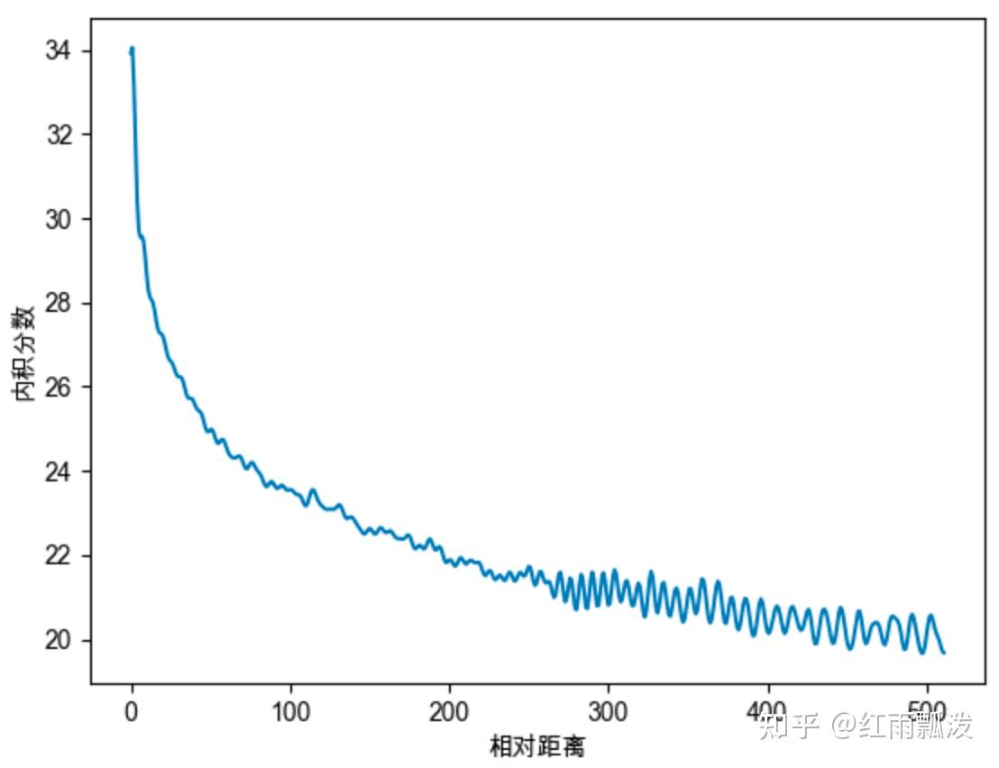<br>refer to: https://zhuanlan.zhihu.com/p/667864459 |假设 $\theta = 1$, 随机初始化两个向量 $q$ 和 $k$, 将 $q$ 固定在位置 0 上, $k$ 的位置从 0 开始逐步变大, 依次计算 $q$ 和 $k$ 之间的内积。随着 $q$ 和 $k$ 的相对距离的增加, 它们之间的内积分数呈现出一定的震荡特性, 缺乏了重要的远程衰减性, 这并不是我们希望的 <br> 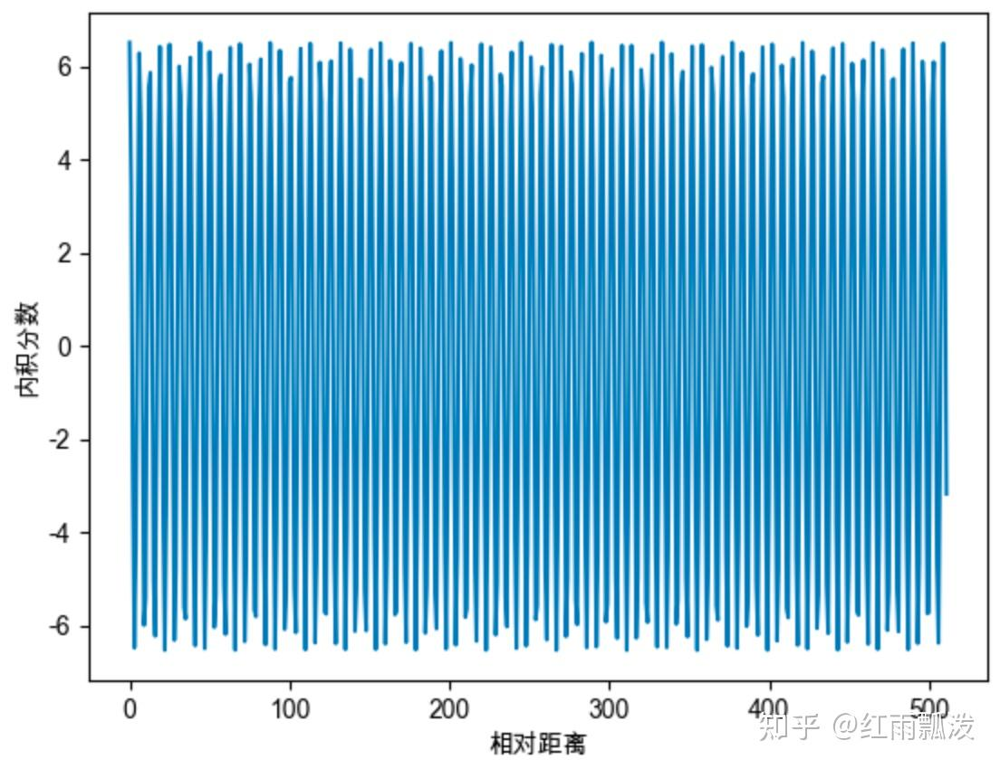 |
| | | 假设 $\theta_i = 10000^{-\frac{2i}{d}}$, 随机初始化两个向量 $q$ 和 $k$, 将 $q$ 固定在位置 0 上, $k$ 的位置从 0 开始逐步变大, 依次计算 $q$ 和 $k$ 之间的内积。随着 $q$ 和 $k$ 的相对距离的增加, 它们之间的内积分数呈现出远程衰减的性质 <br> 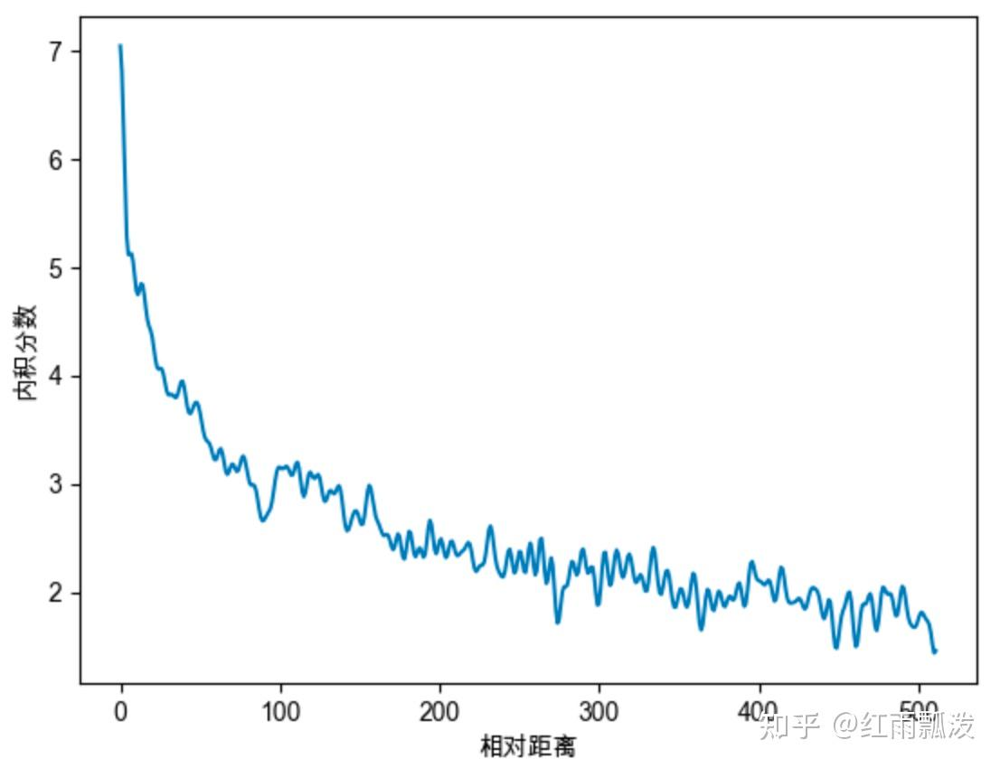<br>从图中我们可以看到随着相对距离的变大, 内积结果有衰减趋势的出现。因此，选择 $\theta_i = 10000^{-\frac{2i}{d}}$, 确实能带来一定的远程衰减性。论文中还尝试以 $\theta_i = 10000^{-\frac{2i}{d}}$ 为初始化, 将 $\theta_i$ 视为可训练参数, 然后训练一段时间后发现 $\theta_i$ 并没有显著更新, 因此干脆就直接固定了。 |
| | | 假设 $\theta_i = \text{base}^{-\frac{2i}{d}}$, 初始化两个全 1 向量 $q$ 和 $k$ (为了让图像显得不那么杂乱), 将 $q$ 固定在位置 0 上, $k$ 的位置从 0 开始逐步变大, 依次计算 $q$ 和 $k$ 之间的内积。当我们将 base 取不同的值的时候, $q$ 和 $k$ 的内积随着相对位置变化趋势如下图。<br>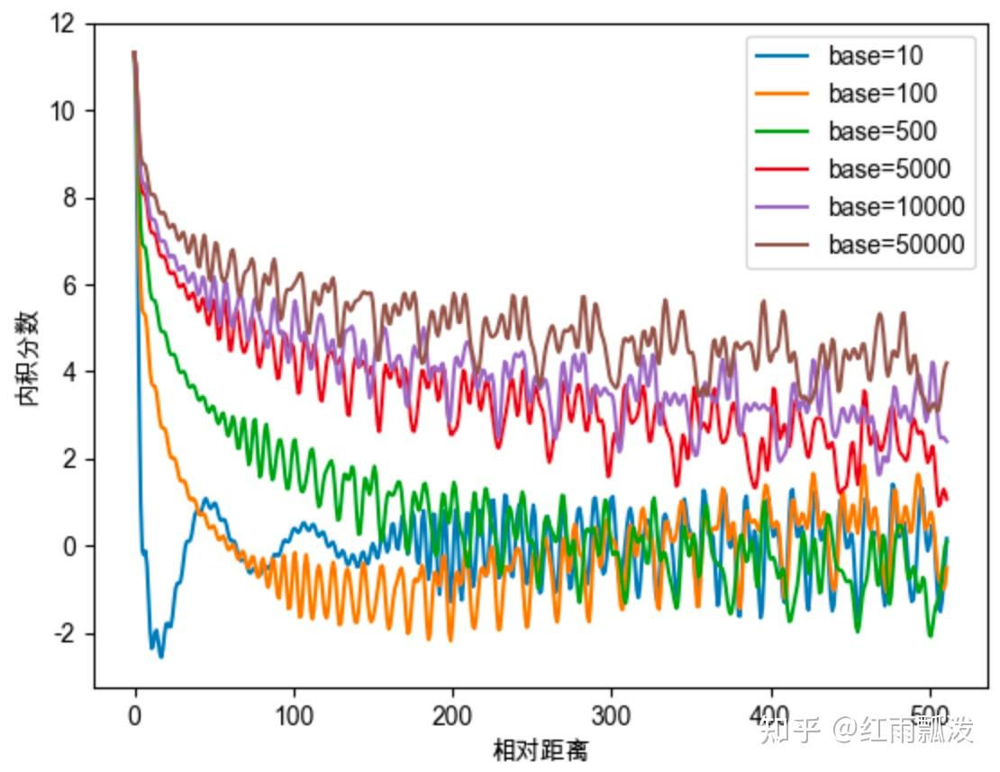 <br> **base 的取值不同会影响注意力远程衰减的程度**。当 base 大于 500 时, 随着 base 的提升, 远程衰减的程度会逐渐削弱。但太小的 base 也会破坏注意力远程衰减的性质, 例如 base = 10 或 100 时, 注意力分数不再随着相对位置的增大呈现出震荡下降的趋势。更极端的情况下, 当 base = 1 时, 即所有$\theta = 1$, 将完全失去远程衰减特性。<br><br>对于 base 的性质的研究, 与大模型的长度外推息息相关, 如 NTK-Aware Scaled RoPE、NTK-by-parts、Dynamic NTK 等长度外推方法, 本质上都是通过改变base, 从而影响每个位置对应的旋转角度, 进而影响模型的位置编码信息, 最终达到长度外推的目的。目前大多长度外推工作都是通过放大 base 以提升模型的输入长度, 例如 Code LLaMA 将 base 设为1000000, LLaMA2 Long 设为 500000, **但更大的 base 也将使注意力远程衰减的性质变弱, 改变模型的注意力分布, 导致模型的输出质量下降*|



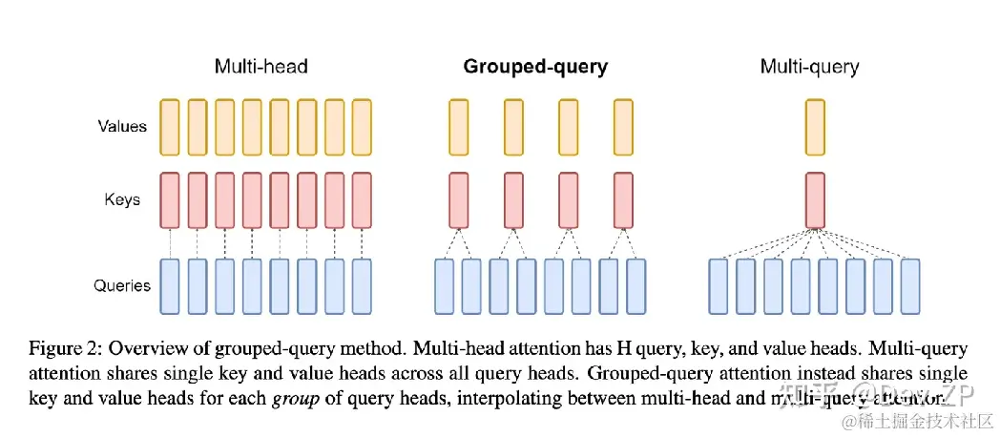

In [ ]:
import torch
import torch.nn as nn
from torch import Tensor

class RMSNorm(nn.Module):
  def __init__(self, hidden_size: int, eps: float = 1e-6) -> None:
    super().__init__()
    self.eps = eps
    self.weight = nn.Parameter(torch.ones(hidden_size))
  
  def _norm(self, x: Tensor) -> Tensor:
    variance = x.pow(2).mean(-1, keepdim=True)
    return x * torch.rsqrt(variance + self.eps)
  
  def forward(self, x: Tensor) -> Tensor:
    return self.weight * self._norm(x.float()).type_as(x)
    
class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        self.linear = nn.Linear(in_features=10, out_features=5)
        self.rmsnorm = RMSNorm(hidden_size=5)

    def forward(self, x):
        x = self.linear(x)
        x = self.rmsnorm(x)
        return x


net = SimpleNet()


input_data = torch.randn(2, 10)  # 2个样本，每个样本包含10个特征

output = net(input_data)

print("Input Shape:", input_data.shape)
print("Output Shape:", output.shape)

LLama2 主要组件:  
1. 多头自注意力层(Multi-Head Self-Attention Layer): 计算输入序列中每个位置的注意力分布, 捕捉序列内部的依赖关系。 
2. 前馈神经网络(Feed-Forward Neural Network, FFN): 对每个位置的表示进行非线性变换, 提高模型的表达能力。
3. 残差连接和层归一化(Residual Connection and Layer Normalization): 通过残差连接缓解深层网络的梯度消失问题, 通过层归一化加速训练收敛。

训练策略:
1. 数据增强  
数据增强技术在训练过程中起到了重要作用，通过引入噪声、随机掩码等方法，增强模型的泛化能力。例如，随机遮掩（Masked Language Modeling, MLM）任务，通过随机遮掩输入序列中的部分词标记，训练模型预测被遮掩的词。

2. 梯度累积  
由于Llama 2的模型参数量巨大，直接训练需要大量的计算资源。梯度累积技术通过在多个小批次上累积梯度，再进行一次反向传播，降低了单次训练的显存需求，提高了训练效率。

3. 混合精度训练  
混合精度训练通过使用半精度浮点数（FP16）和单精度浮点数（FP32）相结合的方法，减少计算和存储需求，同时保证训练的数值稳定性。具体方法是在前向传播和梯度计算中使用FP16，在梯度累积和更新参数时使用FP32。

# 绝对位置编码 vs 相对位置编码
| | 绝对位置编码 | 相对位置编码 |
| :- | :- | :- |
| 局限性 | 1. 有限序列长度: 如果模型学习到某个点的位置向量, 它本质上不能表示超出该限制的位置。<br>2. 位置嵌入的独立性: 每个位置嵌入都是独立于其他位置嵌入的。这意味着在模型看来, 位置 1 和 2 之间的差异与位置 2 和 500 之间的差异相同。但是其实位置 1 和 2 应该比位置 500 相关性更密切, 位置 500  距离明显更远。这种相对定位的缺乏可能会阻碍模型理解语言结构的细微差别的能力。 | 1. 计算效率低下: 必须创建成对的位置编码矩阵, 然后执行大量张量操作以获得每个时间步的相对位置编码。特别是对于较长的序列。这主要是由于自注意力层中的额外计算步骤, 其中位置矩阵被添加到查询键矩阵中。<br>2. 键值缓存使用的复杂性: 由于每个附加令牌都会改变每个其他令牌的嵌入, 这使得 Transformer 中键值缓存的有效使用变得复杂。使用 KV 缓存的一项要求是已经生成的单词的位置编码, 在生成新单词时不改变(绝对位置编码提供)因此相对位置编码不适合推理, 因为每个标记的嵌入会随着每个新时间步的变化而变化。<br>refer to: https://cloud.tencent.com/developer/article/2403895 |
| | 绝对位置编码为每个位置分配一个唯一的向量, 虽然简单但不能很好地扩展并且无法有效捕获相对位置 | 相对位置编码关注标记之间的距离, 增强模型对标记关系的理解, 但使模型架构复杂化 |
| | 如果要处理更大长度的输入输出, 使用绝对位置编码就需要把训练数据也加长到推理所需长度, 否则对于没训练过的长度(训练时没见过的位置编码), 效果多少会打些折扣。| 而使用相对位置编码则更容易外推, 毕竟 token-2 和 token-1 的距离, 与 token-10002 和 token-10001 的距离是一样的, 也因此可以缓解对巨量长文本数据的需求。<br>但是传统相对位置编码的实现相对复杂, 有些也会有计算效率低的问题。由于修改了 self-attention 的计算方式, 也比较难推广到线性注意力计算法模型中。<br>refer to: https://www.linsight.cn/a051710f.html|

# Llama2 vs Llama3

| | Llama1 | Llama2 | Llama3 |
| :- | :- | :- | :- |
| 上下文长度 max_position_embeddings | 2048 | 4096 | 8192 |
| tokenizer vocab_size | sentencepiece | sentencepiece | tiktoken, 与 GPT-4 一致 |
| vocab_size | 32K | 32K | 128K |
| FFN intermediate_size | | 11008 | 14336 |

todo: https://cloud.tencent.com/developer/article/2411892

# FlashAttention
## V1
refer to: 
- [FlashAttention: Fast and Memory-Efficient Exact Attention with IO-Awareness](https://arxiv.org/pdf/2205.14135)
- [图解大模型计算加速系列：FlashAttention V1，从硬件到计算逻辑](https://zhuanlan.zhihu.com/p/669926191)
- [memory efficient attention](https://arxiv.org/pdf/2112.05682)
- [动画演示](https://www.bilibili.com/video/BV1HJWZeSEF4/)
1. 分块计算: 将输入矩阵划分为小块, 并逐块在 SRAM 上计算注意力, 避免将整个 N×N 矩阵存储于显存
   - 按 $i$ (下图中的行)遍历后, 读写量也不过是 $m_i, l_i, O_i$, 比标准算法的$S_{ij}, P_{ij}, O_i$少很多, 节省了对$S_{ij}, P_{ij}$ 的读写。
   - 在算法中仅使用归一化前的$\tilde{P}_{ij}$, 而不是归一化后的$P_{ij}$
   - 其中, $S_{ij} = QK^T$ 称为 Attention Scores; $P_{ij}$ 是对 $S_{ij}$ 进行逐行 softmax 的结果, 称为 Normalized Attention Scores, 或 Attention Weights
2. 重计算: 通过前向传播时保存归一化因子$m, l$, 避免在反向传播中存储中间结果$S_{ij}, P_{ij}$, 而是通过重计算得出注意力矩阵。这虽然增加了浮点运算次数, 但通过减少 HBM 访问, 提升了整体效率
3. 利用更高速的上层存储计算单元(SRAM), 减少对低速更下层存储器(HBM)的访问次数, 提升模型的训练性能
4. 分块之后 FlashAttention 将矩阵乘法、mask、softmax、dropout 操作合并成一个kernel, 目标是降低 MAC, 即使增加 FLOPS
   - **Compute-bound**: 计算密集型。整个计算的耗时主要在于计算本身, 对显存的读写几乎可以忽略。典型的计算包括大矩阵乘法、大 channel size 的卷积操作等。对于这类 operator, 它们的 FLOPS 决定了计算时耗。
   - **Memory-bound**: 存储访问密集型。整个计算的耗时主要集中在存储的访问上, 计算本身耗时较低。典型的计算包括逐元素操作(ReLU，Dropout等), 以及 Reduce 操作(求和、softmax、BatchNorm 等)。对于这类 operator, 它们的 Memory Access Cost(MAC) 决定了计算时耗。
   - 在绝大多数的神经网络中, 因为含有大量 Memory-bound 操作, 所以 MAC 的开销都不能忽略。但绝大多数 Efficient Transformer 都忽略了MAC, 虽然它们整体的 FLOPS 降低了,但计算时耗并没有降低。
   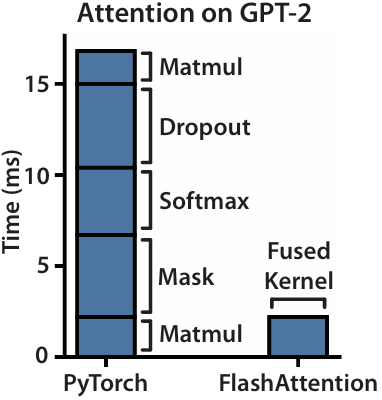
6. 巧妙利用 GPU 内存层次结构和数学技巧, FlashAttention 在不牺牲准确性的情况下实现速度和内存使用率的大幅提升

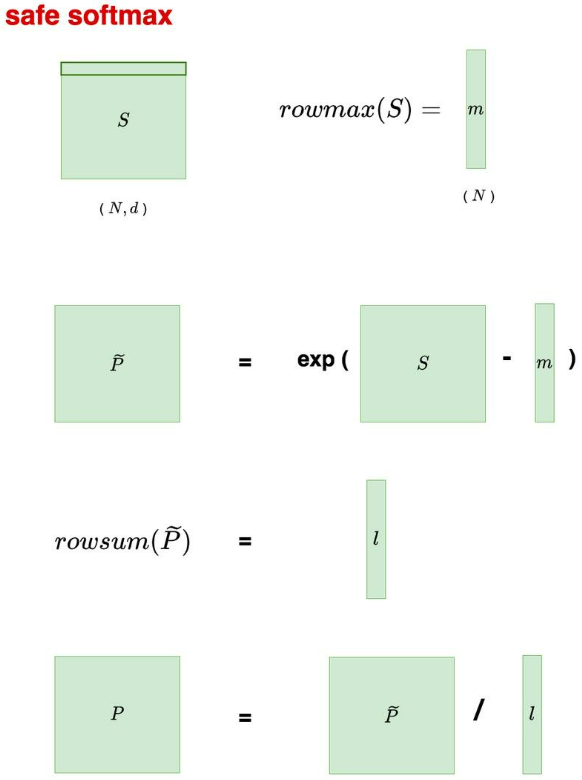
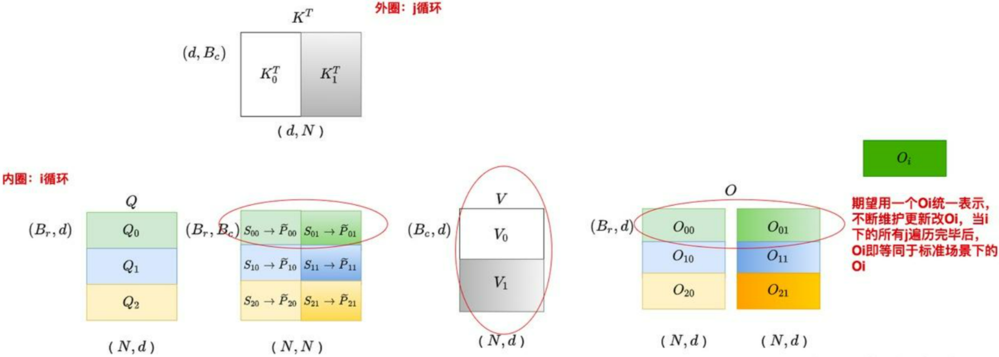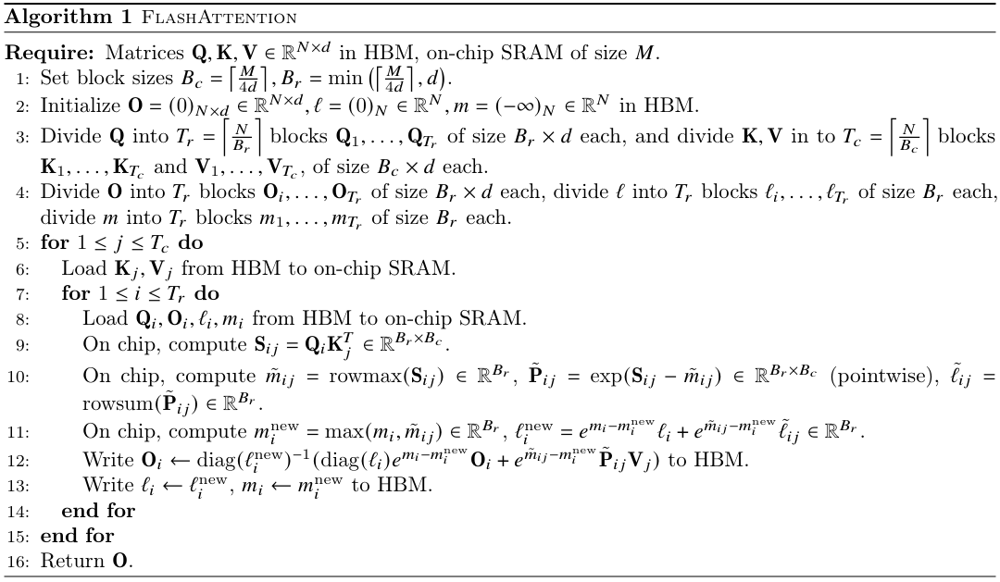

## [Online normalizer calculation for softmax](https://arxiv.org/pdf/1805.02867)
打破之前必须先算完一整行的 $QK^T$ 结果, 再乘以 $V$ 的依赖关系。算出 local softmax 结果立刻和 $V$ 的分块运算, 后面再通过乘系数矫正即可


## V2
refer to: 
- [FlashAttention-2: Faster Attention with Better Parallelism and Work Partitioning](https://arxiv.org/pdf/2307.08691)
- [图解大模型计算加速系列：FlashAttention V2，从原理到并行计算](https://zhuanlan.zhihu.com/p/691067658)

1. 置换内外循环, 减少非矩阵计算量
2. 优化 thread blocks 的并行化计, 增加 seq_len 维度的并行, 提升shared memoryM 利用率
3. 优化 thread blocks 内部 warp 级别的工作模式, 减少 warp 间的通讯和读取 shared memory 的次数

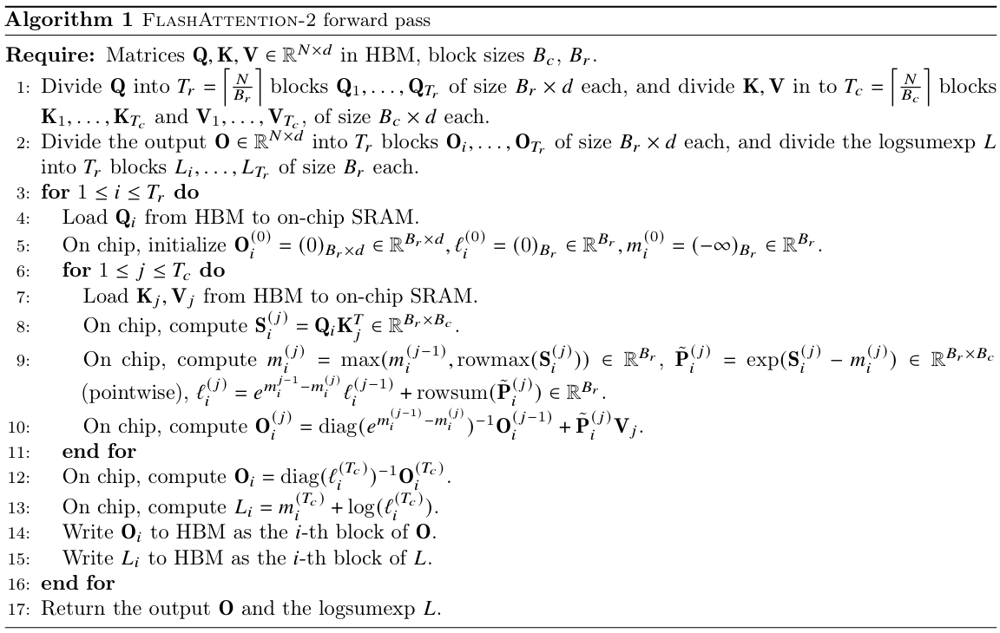
## V1 vs V2

| FlashAttention | V1 | V2 |
| :- | :- | :- |
| 置换内外循环 | K, V 为外循环, Q 为内循环 | Forward 中 Q 为外循环, K, V 为内循环, 避免 V1 Forward Algorithm step 15 $O_i$ 反复从 HBM 读写<br> Backward 中 K, V 为外循环, Q 为内循环 |
| 减少非矩阵的计算 | | V2 Farword Algorithm step 10 中 $O_i$ 的计算中缺少归一化项 $\text{diag}(l_i^{T_c})^{-1}$, 这一项其实放到 step 12 做统一计算。这也是V2优化的一个点: 尽量减少非矩阵的计算, 因为在GPU中, 非矩阵计算比矩阵计算慢16倍。|
| | | V2 中不再存每一 $Q$ 分块对应的 $m_i^{(j)}$ 和 $l_i^{(j)}$, 只存 V2 Farword Algorithm step 13 $L_i = m_i^{(T_c)} + \log(l_i^{(T_c)}) $, 用于 Backward 计算, 减少从 shared memory 读写, 从 $m_i$ + $l_i$ 减少为 $L_i$|
| thread block | 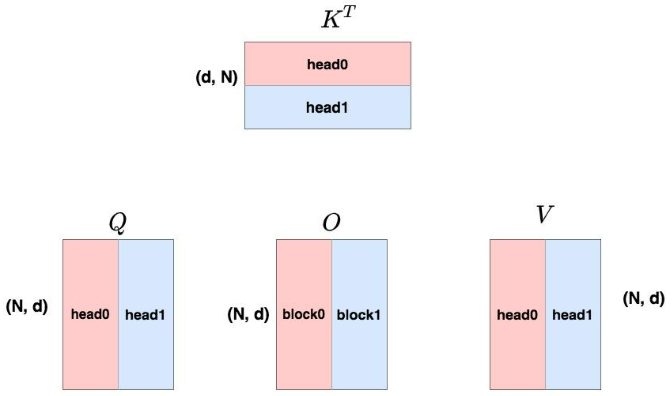<br>from https://zhuanlan.zhihu.com/p/691067658 | 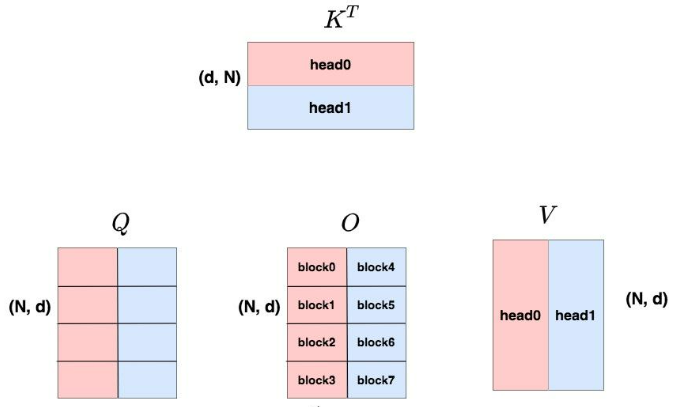 
| | 按 grid(batch_size, num_heads) 划分block | 按 grid(num_m_blocks, batch_size, num_heads) 划分block<br>新增 Q 的 seq_len 维度(上图中的 N 维度)上的划分 |
| | 在V1后期的版本中, 也出现 seq 维度的并行<br>V1 grid 的组织形式为(batch_size, num_heads, num_m_blocks) | |
| warp | 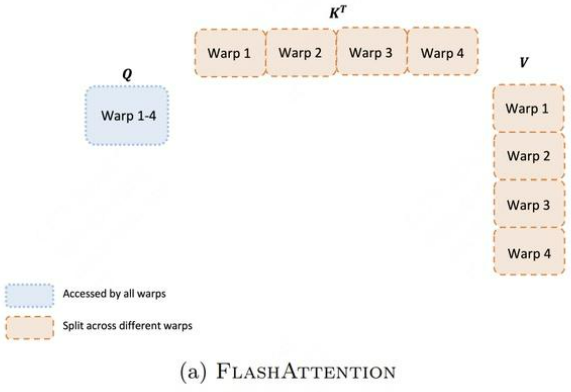 | 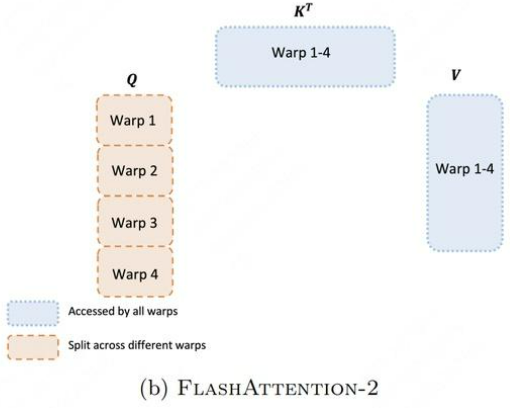 |
| | 每个 warp 都从 shared memory 上读取相同的 Q 块以及自己所负责计算的 KV 块。每个 warp 需要把自己算出来的中间结果写到 shared memory上, 再由下一个 warp 读取, warp 间需要通讯、需要写中间结果, 降低计算效率| 每个 warp 都从 shared memory 上读取相同的 KV 块以及自己所负责计算的 Q 块。每个 warp 把自己计算出的结果写到 O 的对应位置即可, warp 间不再需要通讯, 提升了计算效率 |
| | | 不过这种 warp 并行方式在 V2 Backward 中有缺陷: 由于 Backward 中 dK 和 dV 是在行方向上 All Reduce, 所以这种切分方式会导致 warp 间需要通讯 |

## V3
refer to: [FlashAttention-3: Fast and Accurate Attention with Asynchrony and Low-precision](https://arxiv.org/pdf/2407.08608)
1. 引入生产者-消费者异步机制, 提升并行度
2. 优化 GEMM 和 Softmax 操作的重叠计算
3. 支持 FP8 低精度硬件加速, 提升吞吐量并减少精度损失
6. 不连贯的处理: 一种在使用低精度格式时减少量化误差的技术

# deepspeed
在分布式计算环境中，有几个非常基础的概念需要理解：
- 节点编号（node_rank:）：分配给系统中每个节点的唯一标识符，用于区分不同计算机之间的通信。  
- 全局进程编号（rank）：分配给整个系统中的每个进程的唯一标识符，用于区分不同进程之间的通信。  
- 局部进程编号（local_rank）：分配给单个节点内的每个进程的唯一标识符，用于区分同一节点内的不同进程之间的通信。  
- 全局总进程数（word_size）：在整个系统中运行的所有进程的总数，用于确定可以并行完成多少工作以及需要完成任务所需的资源数量。  
- 主节点（master_ip+master_port）：在分布式计算环境中，主节点负责协调所有其他节点和进程的工作，为了确定主节点，我们需要知道它的IP地址和端口号。主节点还负责监控系统状态、处理任务分配和结果汇总等任务，因此是整个系统的关键部分。  

deepspeed 还提供了 mpi、gloo 和 nccl 等通信策略，可以根据具体情况进行选择和配置。
- mpi 是一种跨节点通信库，常用于 CPU 集群上的分布式训练；  
- gloo 是一种高性能的分布式训练框架，支持 CPU 和 GPU 上的分布式训练；  
- nccl 是 NVIDIA 提供的 GPU 专用通信库，被广泛应用于 GPU 上的分布式训练。  

---

## [Zero: Memory optimizations toward training trillion parameter models](https://fid3024.github.io/papers/2020%20-%20ZeRO:%20Memory%20Optimizations%20Toward%20Training%20Trillion%20Parameter%20Models.pdf)

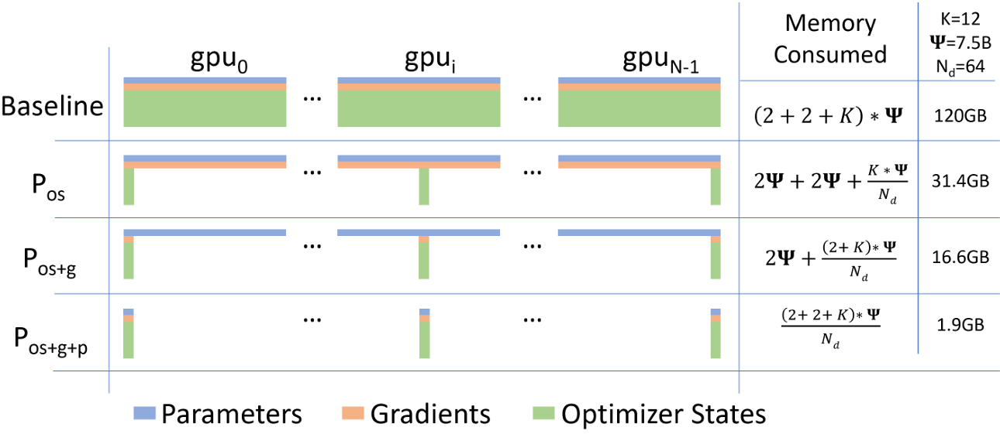
图 1: 比较ZeRO-DP 优化的三个阶段中, model states 的每个设备内存消耗。$\Phi$ 表示模型大小(参数数量), $K$ 表示 optimizer states 的内存乘子, $N_d$ 表示数据并行度。在这个例子中, 我们假设模型大小为 $7.5B$, 数据并行度为 $N_d = 64$, $K = 12$, 基于使用 Adam 优化器的混合精度训练。

核心思想: 为了解决 model states 的内存占用问题, 通过在数据并行(DP)进程中划分模型状态(参数, 梯度和优化器状态), 而不是复制它们, 从而消除了数据并行进程中的内存冗余。

## 显存占用
| | Model Parameter<br>(fp32) | Optimizer States | Model Parameter<br>(fp16) | Gradient<br>(fp16) | 激活值的<br>显存占用 | 总计 |
| :-: | :-: | :-: | :-: | :-: | :-: | :-: |
| | 只在 Forward 和 Backward 时使用 | 只在 Adam Optimizer 进行梯度更新时使用<br>Momentum (fp32) + Variance (fp32) | | 反向传播后所产生的梯度信息, 其决定参数的更新方向 | |
| | 4$\Psi$ | 4$\Psi$ + 4$\Psi$ | 2$\Psi$ | 2$\Psi$ | 16$\Psi$ |
| ZeRO1 | | 10.5GB<br>= 7GB * 12($\Psi$) / 8(卡) = 84GB / 8 | 14GB | 14GB | 0.25 GB<br>=1(batch size) * 1024(序列长度) * 4096(隐藏层维度) * 2(字节) * 32(层)<br>$\approx$ 8MB * 32 = 256MB | 38.75G |
| ZeRO2 | | 10.5GB | 14GB | 1.75GB | 0.25 GB | 26.5G | 
| ZeRO3 | | 10.5GB | 1.75GB | 1.75GB | 0.25 GB | 14.25G |

## 数据并行
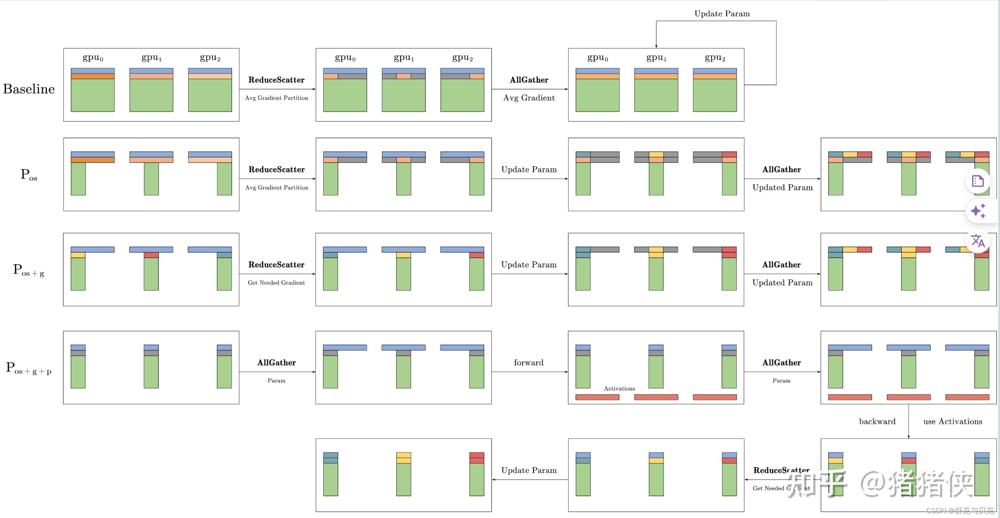
refer to: https://blog.csdn.net/zwqjoy/article/details/130732601

| | 数据并行的流程 | 总通讯量 |
| :- | :- | :- |
| Data Parallel (DP) | 1. 将一个 batch 的训练数据分成 N 份, N 个显卡同时进行 Forward 和 Backward<br>2. 每个显卡生成的梯度 $g$ 都发送给主节点<br>3. 主节点汇总梯度 $g$, 然后结合 优化状态 $o$ 更新参数 $w$<br>4. 将更新后的参数 $w$ 广播发送给其他节点 | 主节点传入梯度 $(N - 1)\Psi$, 传出参数 $(N - 1)\Psi$<br>其他节点传入梯度 $\Psi$, 传出参数 $\Psi$ |
| Distributed Data Parallel (DDP)<br>$\text{Baseline}$ | 1. 将一个 batch 的数据分成3份, 每块 GPU 各一份, 进行一轮 Foward 和 Backward 后, 得到各自维护的一份梯度 $g$。<br>2. 对梯度 $g$ 执行一次 Reduce-Scatter, 单卡产生的通讯量$\Psi$。<br>3. 对梯度 $g$ 执行一次 All-Gather, 单卡产生的通讯量$\Psi$, 每块 GPU 均得到一份完整的梯度 $g$。<br>4. 每张 GPU 根据各自完成的梯度 $g$ 和优化状态 $o$ 更新参数 $w$。| $2\Psi$ |
| ZeRO1<br>$P_{os}$ | 1. 每块 GPU 上存一份完整的参数 $w$。将一个 batch 的数据分成3份, 每块 GPU 各一份, 进行一轮 Foward 和 Backward 后, 得到各自维护的一份梯度 $g$。<br>2. 对梯度 $g$ 执行一次 Reduce-Scatter, 单卡产生的通讯量$\Psi$。<br>3. 用各自维护的梯度 $g$ 和优化状态 $o$ 更新对应的权重 $w$。<br>4. 对权重 $w$ 执行一次 All-Gather, 单卡产生的通讯量$\Psi$, 得到完整的权重 $w$。| $2\Psi$ |
| ZeRO2<br>$P_{os + g}$ | 1. 每块 GPU 上存一份完整的参数 $w$。将一个 batch 的数据分成3份, 每块 GPU 各一份, 进行一轮 Foward 和 Backward 后, 得到各自维护的一份梯度 $g$。<br>2. 对梯度 $g$ 执行一次 Reduce-Scatter, 单卡产生的通讯量$\Psi$, 然后**从显存中移除不需要维护的其他梯度**。<br>3. 用各自维护的梯度 $g$ 和优化状态 $o$ 更新对应的权重 $w$。<br>4. 对权重 $w$ 执行一次 All-Gather, 单卡产生的通讯量$\Psi$, 得到完整的权重 $w$。| $2\Psi$ |
| ZeRO3<br>$P_{os + g + p}$ | 1. 每块 GPU 上只保存部分参数 $w$。将一个 batch 的数据分成3份, 每块 GPU 各一份。<br>2. 对权重 $w$ 执行一次 All-Gather, 单卡产生的通讯量$\Psi$, 得到完整的权重 $w$。<br>3. 进行一次 Forward, 完后从显存中移除不需要维护的其他权重 $w$。<br>4. 再对权重 $w$ 执行一次 All-Gather, 单卡产生的通讯量$\Psi$, 得到完整的权重 $w$。<br>5. 进行一次 Backward, 得到各自维护的一份梯度 $g$, 然后从显存中移除不需要维护的其他权重 $w$。<br>6. 对梯度 $g$ 执行一次 Reduce-Scatter, 单卡产生的通讯量$\Psi$, 然后从显存中移除不需要维护的其他梯度。<br>7. 用各自维护的梯度 $g$ 和优化状态 $o$ 更新对应的权重 $w$。由于只需要维护部分权重 $w$, 无需再对权重 $w$ 执行 All-Gather。| $3\Psi$ |

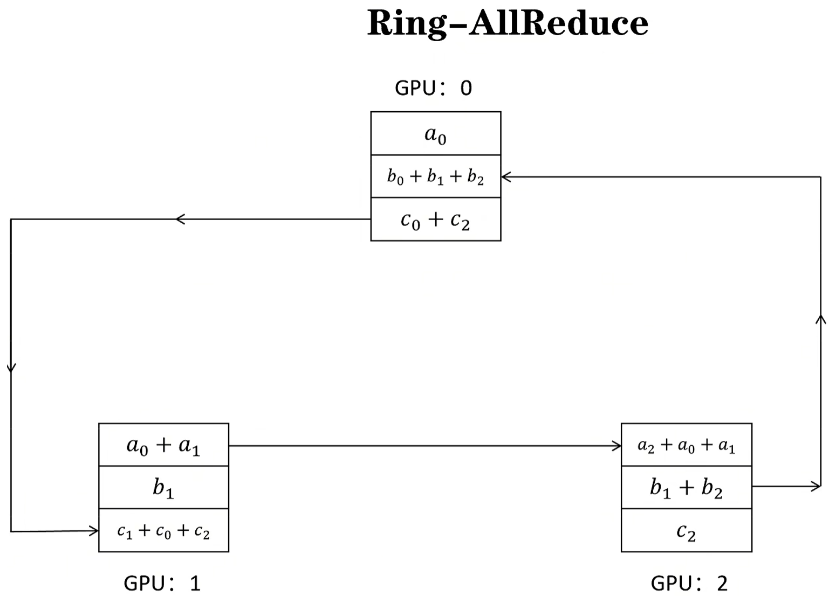
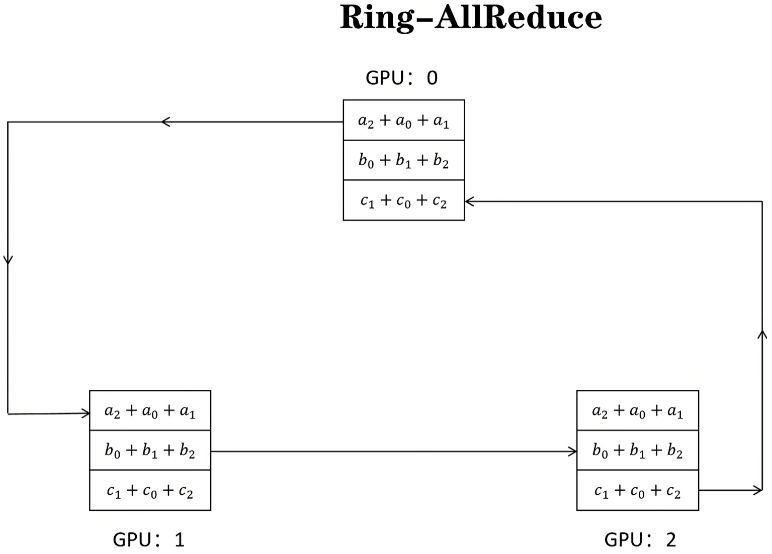
refer to: https://www.cnblogs.com/theseventhson/p/18326382

## 混合精度
paper: [Mixed Precision Training](https://arxiv.org/pdf/1710.03740)


- 存储一份 fp32 的 parameter, momentum, variance (统称 model states)
- 在 Forward 开始之前, 额外开辟一块存储空间, 将 fp32 parameter 减半到 fp16 parameter
- 正常做 Forward 和 Backward, 在此之间产生的 activation 和 gradients, 都用fp16进行存储
- 用 fp16 gradients 去更新 fp32 model states
- 当模型收敛后, fp32 parameter 就是最终的参数输出

## ZeRO-Offloa
paper:
- [ZeRO-Offload: Democratizing Billion-Scale Model Training](https://arxiv.org/pdf/2101.06840)
- [ZeRO-Infinity: Breaking the GPU Memory Wall for Extreme Scale Deep Learning](https://arxiv.org/pdf/2104.07857)

1. 将 Forward 和 Backward 相关的高计算量部分, 例如 Parameter (fp16), activation, 放入 GPU。
2. 将 Update 相关的低计算量部分, 例如 Optimizer States (fp32) 和 Gradient (fp16) 等, 放入 CPU。

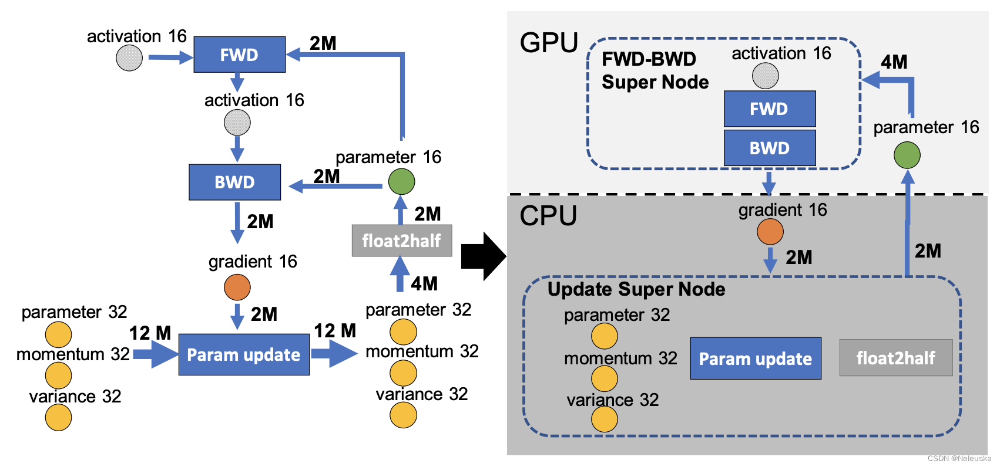
refer to: https://blog.csdn.net/Neleuska/article/details/136645597

# KV Cache
通过空间换时间, 将每个 token 与 $W_K,W_V$ 相乘得到的 $K, V$ 矩阵缓存, 以加速推理过程

## 使用KV Cache和不使用KV Cache的可视化对比
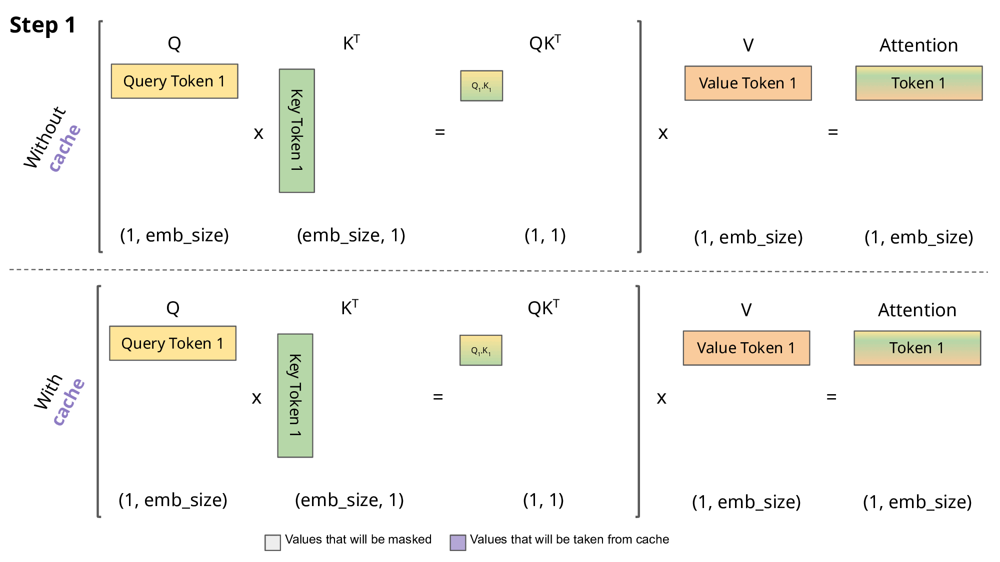
refer to: https://blog.csdn.net/ningyanggege/article/details/134564203
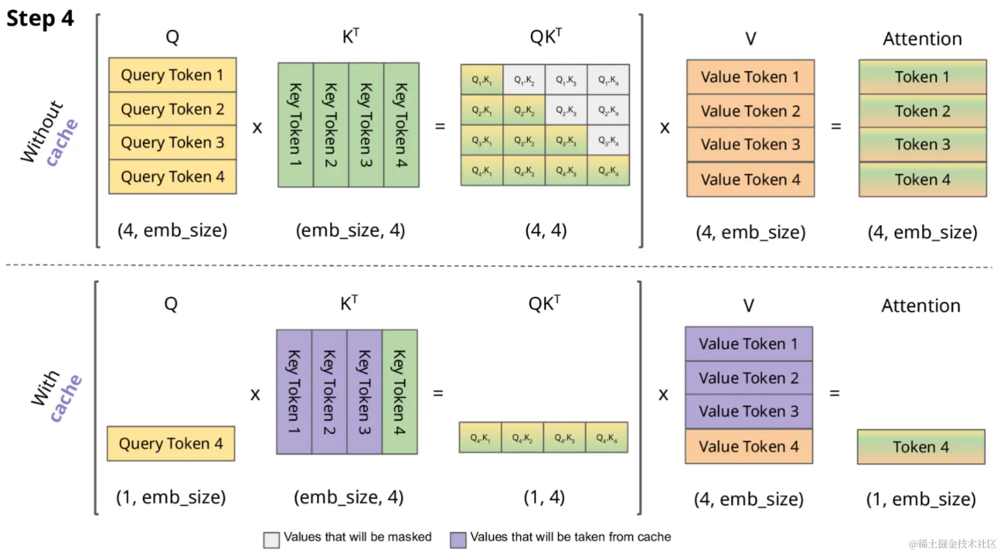
refer to: https://juejin.cn/post/7362789570217885759


$$\begin{align}
{\color{red}{\text{Attention}_1}}(Q, K, V) & = \text{softmax}({\color{red}{Q_1}} K_1^T) V_1 \\
{\color{orange}{\text{Attention}_2}}(Q, K, V) & = \text{softmax}({\color{orange}{Q_2}} K_1^T) V_1 + \text{softmax}({\color{orange}{Q_2}} K_2^T) V_2 \\
{\color{blue}{\text{Attention}_3}}(Q, K, V) & = \text{softmax}({\color{blue}{Q_3}} K_1^T) V_1 + \text{softmax}({\color{blue}{Q_3}} K_2^T) V_2 + \text{softmax}({\color{blue}{Q_3}} K_3^T) V_3 \\
{\color{green}{\text{Attention}_4}}(Q, K, V) & = \text{softmax}({\color{green}{Q_4}} K_1^T) V_1 + \text{softmax}({\color{green}{Q_4}} K_2^T) V_2 + \text{softmax}({\color{green}{Q_4}} K_3^T) V_3 + \text{softmax}({\color{green}{Q_4}} K_4^T) V_4 \\
\end{align}$$



## 计算过程
预填充阶段, 注意力层一次性处理所有 prompt 的 tokens, 为每个 为每个 transformer 层计算并存储 key 和 value 存入 cache; 
解码阶段只需从 cache 中读取历史 key 和 value 数据, 并根据当前 token 计算出的 key 和 value 添加到 cache 中
### 预填充阶段
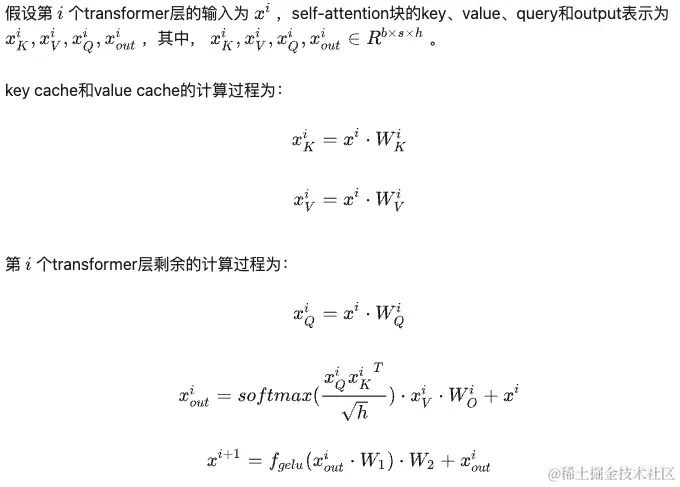
### 解码阶段
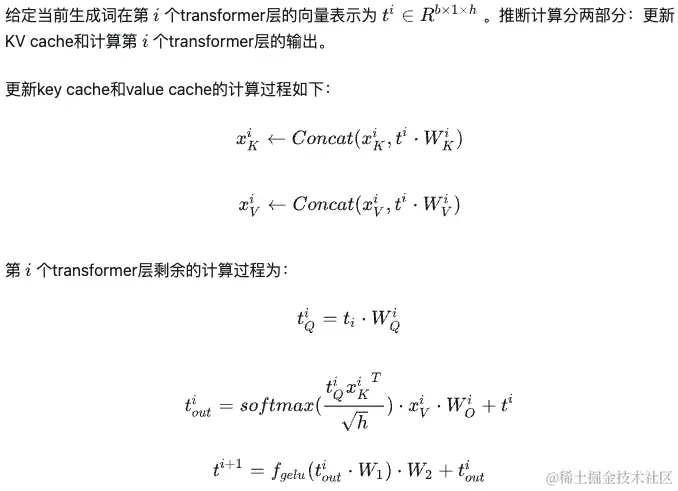

refer to: https://juejin.cn/post/7362789570217885759

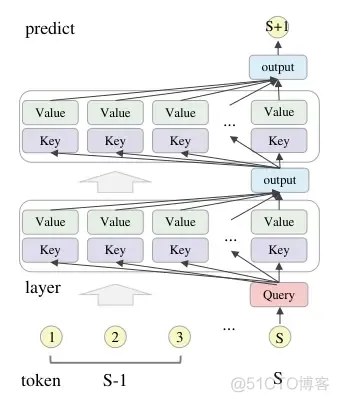

refer to: https://blog.51cto.com/u_16163453/12409138

## 优点
- 在计算 $x W_q, x W_k, x W_v$ 时, 原来的输入 $x$ 的 size 为 [batch_size, seq_len, embed_dim], 使用 KV Cache 后的 $x$ 的 size 变为 [batch_size, 1, embed_dim], multi-head attention 层的计算量减小
- 在计算 $\text{softmax}\left( \frac{Q⋅K⊤}{\sqrt{d_k}} \right) \cdot V$ 时, $K$ 和 $V$ 的维度与原来一样, 但是 $Q$ 的维度减少至 1
- 使用 KV Cache 后, MLP 层和 FFN 前馈传播层的计算量也减小, 因为其 forward() 函数的输入维度由原来的 [batch_size, seq_len, ebemd_dim] 减少至 [batch_size, 1, ebemd_dim]

refer to: http://mingchao.wang/Ao5PjBRP/

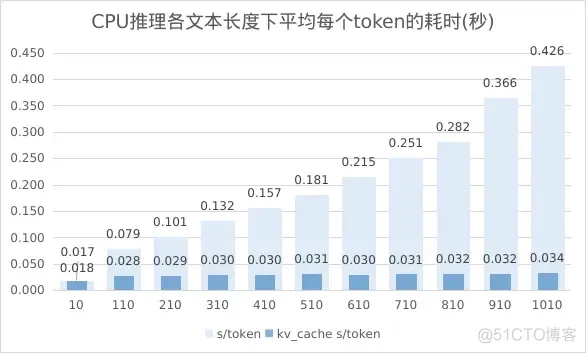

refer to: https://blog.51cto.com/u_16163453/12409138

## 缺点
- 上下文越长, KV Cache 占用的显存也越大

## 后续改进
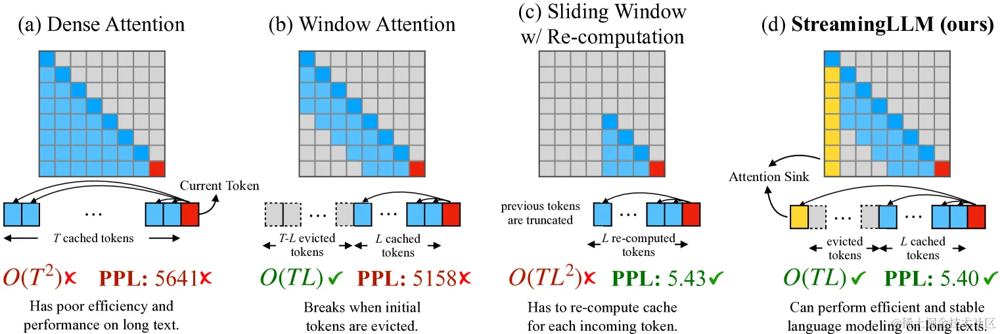
- **Window Attention**: 只缓存最近的 L 个 token 的 $KV$。虽然推理效率很高, 但一旦起始 token 的键和值被排除, 性能就会急剧下降。
- **Sliding Window w/ Re-computation**: 根据当前 token 及其之前的 L-1 个 token 重建 $KV$ 状态。虽然在长文本上表现良好, 但其 $O(TL^2)$ 的复杂度(源于上下文重新计算中的二次注意力)使其相当慢。
- **StreamingLLM**: 在滑动窗口的基础上, 在注意力计算中重新引入了一些最初的 tokens 的 $KV$。可以无缝地融入任何使用相对位置编码的自回归语言模型, 如 RoPE 和 ALiBi。

## 解码阶段计算量分析 & 显存占用分析
refer to: https://juejin.cn/post/7362789570217885759

# 推理框架

| 框架特点说明 | 优点 | 缺点 |
| :- | :- | :- |
|**vLLM**: 一个开源的大模型推理加速框架, 通过 PagedAttention 高效地管理 attention 中缓存的张量, 实现了比 HuggingFace Transformers 高14-24倍的吞吐量。它兼容 OpenAI 的接口服务, 并与 HuggingFace 模型无缝集成。 | 1. 高效的服务吞吐量: vLLM 可以快速处理大量的并发请求<br>2. 支持模型种类多<br>3. 内存高效: vLLM使用了一种名为 PagedAttention 的技术, 可以高效地管理注意力键和值的内存<br>4. **文本生成的速度**: 实验多次, 发现vLLM的推理速度是最快的<br>5. **高吞吐量服务**: 支持各种解码算法, 比如 parallel sampling、beam search等<br>6. **与 OpenAI API 兼容**: 如果使用 OpenAI API, 只需要替换端点的URL即可 | 1. 你需要确保你的设备有 GPU, CUDA 或者 RoCm<br>2. **添加自定义模型**: 虽然可以合并自己的模型, 但如果模型没有使用与 vLLM 中现有模型类似的架构, 则过程会变得更加复杂。例如, 增加Falcon的支持, 这似乎很有挑战性<br>3. **缺乏对适配器(LoRA, QLoRA等)的支持**: 当针对特定任务进行微调时, 开源 LLM 具有重要价值。然而, 在当前的实现中, 没有单独使用模型和适配器权重的选项, 这限制了有效利用此类模型的灵活性<br>4. **缺少权重量化**: 有时, LLM 可能不需要使用 GPU 内存, 这对于减少 GPU 内存消耗至关重要 |
| **transformers**: Hugging Face 推出的库 | 1. 自动模型下载<br>2. 提供代码片段<br>3. 非常适合实验和学习 | 1. 需要对ML和NLP有深入了解<br>2. 需要编码和配置技能 |
| **HuggingFace TGI (Text Generation Inference)**: 作为支持 HuggingFace Inference API 的工具, 旨在支持大型语言模型的优化推理。它支持多 GPU 多节点扩展, 可推理万亿规模参数 | 1. 简单的启动 LLM<br>2. 使用 Flash Attention 和 Paged Attention 进行推理的优化的 transformers 代码<br>3. 使用 bitsandbytes GPT-Q EETQ AWQ Safetensors进行量化<br>4. 使用 Open Telemetry, Prometheus 指标进行分布式 | 1. 需要处理的任务或数据与 TGI 的优化技巧不匹配时, 使用传统的Transformer推理可能会更合适。目前测试效果 TGI 的推理速度不如 vLLM<br>2. **缺乏对适配器的支持**: 需要注意的是, 尽管可以使用适配器部署 LLM 但目前还没有官方支持或文档<br>3. **从源代码(Rust+CUDA内核)编译**: 对于不熟悉Rust的人, 将客户化代码纳入库中变得很有挑战性<br>4. **文档不完整**: 所有信息都可以在项目的自述文件中找到。尽管它涵盖了基础知识, 但必须在问题或源代码中搜索更多细节 |
| Text Generation Inference (TGI) 和 Transformer 模型的推理方式有一些区别, 主要体现在以下几个方面: | 1. 并行计算: TGI 和 Transformer 都支持并行计算, 但 TGI 更进一步, 它使用了 Rust 和 Python 联用的方式, 实现了服务效率和业务灵活性的平衡。这使得 TGI 在处理大型语言模型时, 能够更有效地利用计算资源, 提高推理效率<br>2. 优化技巧: TGI 引入了一些优化技巧, 如 continuous batching、Flash Attention 和 Paged Attention 等, 这些技巧可以进一步提高推理的效率和性能。而传统的 Transformer 模型可能没有这些优化技巧<br>3. 模型支持: TGI 支持部署 GPTQ 模型服务, 这使得我们可以在单卡上部署拥有 continuous batching 功能的, 更大的模型。而传统的 Transformer 模型可能没有这样的支持 |
| **DeepSpeed**: 微软出品的高性能推理框架, DeepSpeed-FastGen 利用分块 KV 缓存和动态分割融合连续批处理, 提供了比 vLLM 更好的吞吐 | 1. **支持不同的模型库**: 支持多个开源模型库, 如 Hugging Face、FairSeq、EluetherAI 等<br>2. **量化延迟和降低成本**: 可以显著降低非常昂贵的语言模型的推理成本<br>3. **Native 和 Azure 集成**: 微软开发的 MII 框架提供了与云系统的出色 | 1. **支持模型的数量有限**: 不支持 Falcon, LLaMA2 和其他语言模型<br>2. **缺乏对适配器(LoRA、QLoRA 等)的支持** |
| **Llama.cpp**: Llama.cpp 是一个基于C++的推理引擎, 专门为 Apple Silicon 优化, 可以运行 Meta 的 Llama2 模型。它针对GPU和CPU都做了推理优化 | 性能高于基于 Python 的解决方案, 支持在适度的硬件上运行大型模型, 如 Llama 7B, 并提供绑定, 可以用其他语言构建AI应用程序, 同时通过 Llama.cpp 运行推理 | 模型支持有限, 需要构建工具 |
| **Llamafile**: 由 Mozilla 开发, 基于 C++ 开发, 它使用了 llama.cpp, 这是一个C++库, 提供了运行自托管大型语言模型(LLMs)所需的各种功能。通过 llama.cpp, 开发人员可以轻松地创建、加载和运行LLM模型, 而无需担心底层环境的复杂性。此外, Llamafile 还提供了一个简洁的API接口, 使得开发人员可以更加方便地与 LLM 进行交互, 从而实现各种复杂的应用场景 | 与 Llama.cpp 相同的速度优势, 你可以构建一个嵌入模型的单个可执行文件 | 项目仍处于早期阶段, 不是所有模型都支持, 只支持 Llama.cpp 支持的模型 |
| **Ollama**: 是 Llama.cpp 和 Llamafile 的一个更加用户友好的替代品。你下载一个可执行文件, 它会在你的机器上安装一个服务。安装完成后, 你打开一个终端并运行 | 易于安装和使用, 可以运行 llama 和 vicuña 模型, 运行速度非常快 | 提供有限的模型库, 自己管理模型, 你不能重用自己的模型, 无法调整选项来运行 LLM, 暂时没有 Windows 版本 |
| **TensorRT-LLM**: 英伟达新推出 了TensorRT-LL, ，相对来说更加易, ，后 续FasterTransforme r将不再维护 | 1. 层融合(Layer fusion)<br>2. 自回归模型的推理优化(激活缓存)<br>3. Attention 机制按照演进顺序可以分为 MHA(Multi-head Attention)、MQA(Multi-query Attention) 以及 GQA(Group-query Attention) 机制<br>4. Graph Rewriting, TensorRT-LLM 提供了一组 Python API 用于定义 LLMs, 并且使用最新的优化技术将 LLM 模型转换为 TensorRT Engines, 在将 LLM 模型编译为 TensorRT Engines 时会对神经网络进行优化, 推理时直接使用优化后的 TensorRT Engines | 1. TensorRT-LLM 目前还不是完全开源的<br>2. 需要支持 基于RESTFul A PI的流式(出（, 如， 类似Open A I的L LM 推理A PI), ），还需要进一步 配合FastA PI才能支持流式 |
| **MLC LLM**: Machine Learning Compilation for Large Language Models (MLC LLM) 是一个高性能的通用部署解决方案, 支持任何大语言模型的原生部署。MLC LLM支持以下平台和硬件: AMD GPU、NVIDIA GPU、Apple GPU、Intel GPU、Linux / Win、macOS、Web 浏览器、iOS / iPadOS、Android | 1. 可以部署到 iOS 和 Android 设备上<br>2. 在浏览器上 运行 SD模 型和L LM | 1. **使用 LLM 模型的功能有限**: 不支持适配器, 无法更改精度等, 该库主要用于编译不同设备的模型<br>2. **只支持分组量化**: 这种方法表现良好, 但是在社区中更受欢迎的其他量化方法(bitsandbytes 和 GPTQ)不支持<br>3. **复杂的安装**: 安装需要花几个小时, 不太适合初学者开发人员 |
| **OpenLLM**: OpenLLM 是一个用于在生产中操作大型语言模型(LLM)的开放平台 | 1. **良好的社区支持**: 不断开发和添加新功能<br>2. **集成新模型**: 可以添加用户自定义模型<br>3. **量化**: OpenLLM 支持使用 bitsandbytes 和 GPTQ 进行量化<br>4. **LangChain 集成**: 可以使用 LangChian 与远程 OpenLLM 服务器进行交互 | 1. **缺乏批处理支持**: 对于大量查询, 这很可能会成为应用程序性能的瓶颈<br>2. **缺乏内置的分布式推理**: 如果你想在多个 GPU 设备上运行大型模型, 你需要额外安装 OpenLLM 的服务组件 Yatai |
| **CTranslate2**: CTranslate2 是一个 C++ 和 Python 库, 用于使用 Transformer 模型进行高效推理 | 1. **并行和异步执行**: 可以使用多个GPU或CPU核心并行和异步处理多个批处理<br>2. **Prompt 缓存**: 在静态提示下运行一次模型, 缓存模型状态, 并在将来使用相同的静态提示进行调用时重用<br>3. **磁盘上的轻量级**: 量化可以使模型在磁盘上缩小4倍, 而精度损失最小 | 1. **没有内置的 REST 服务器**: 尽管仍然可以运行 REST 服务器, 但没有具有日志记录和监控功能的现成服务<br>2. **缺乏对适配器(LoRA、QLoRA 等)的支持** |
| **Ray Serve**: Ray Serve 是一个可扩展的模型服务库, 用于构建在线推理 API。Serve 与框架无关, 因此可以使用一个工具包来为深度学习模型的所有内容提供服务 | 1. 文档支持: 开发人员几乎为每个用例撰写了许多示例<br>2. 支持生产环境部署: 这是本列表中所有框架中最成熟的<br>3. 本地 LangChain 集成: 您可以使用 LangChian 与远程 Ray Server 进行交互 | 1. 缺乏内置的模型优化: Ray Serve 不专注于 LLM, 它是一个用于部署任何 ML 模型的更广泛的框架, 必须自己进行优化<br>2. 入门门槛高: 该库功能多, 提高了初学者进入的门槛 |
| refer to: https://juejin.cn/post/7387672843387109430 |

todo:
- [ ] https://gitcode.csdn.net/662f73ccc46af92642790839.html
- [ ] https://blog.csdn.net/njbaige/article/details/139186590
- [ ] https://news.qq.com/rain/a/20241201A01TKR00
- [ ] https://www.cnblogs.com/ting1/p/18225409

# Adam算法
https://zh.d2l.ai/chapter_optimization/adam.html

[1-bit Adam: Communication Efficient Large-Scale Training with Adam's Convergence Speed](https://arxiv.org/pdf/2102.02888)

todo: [Efficient Memory Management for Large Language Model Serving with PagedAttention](https://arxiv.org/pdf/2309.06180)

# 模型的上下文的记忆处理技术有哪些
RAG（Retrieval Augmented Generation），检索增强生成：通过检索的方法来增强生成模型的能力。将文本转换为向量后，需要将文档和向量存储在数据库中，以便后续的检索和分析。向量数据库可以高效地存储大量的文本和向量，同时也有快速的的查询性能。

Fine-Tuning（模型微调）：使用准备好的知识库对LLM进行fine-tuning，让LLM成为领域专家，经常使用lora等低成本finetune，毕竟LLM的全参调参也是非常耗GPU的，从成本考虑不如RAG 向量知识库的形式，效果上很多业务下会比向量数据库略优。

## 高效参数微调方法 PEFT
随着大语言模型的参数量越来越大，进行大模型的全量微调成本很高。高成本主要体现在硬件资源要求高，显存占用多；训练速度慢，耗时长；存储成本高。高效参数微调（parameter-efficient finetuning techniques，PEFT）在微调大模型时只训练一小部分参数，而不是训练全量多模型参数。高效参数微调方法有以下几方面优点：

- 显存占用少，对硬件资源要求低
- 训练速度快，耗时更短
- 更低的存储成本，不同的任务可以共享大部分的权重参数
- 可能会有更好的模型性能，减轻了过拟合问题

## prompt tuning
prompt tuning[13]原本的含义指的是通过修改输入prompt来获得更好的模型效果。这里的提示是“硬提示（hard prompt）”。我们直接修改输入prompt，输入prompt是不可导的。

与“硬提示”相对应，“软提示微调（soft prompt tuning）”将一个可训练张量与输入文本的embeddings拼接起来，这个可训练张量可以通过反向传播来优化，进而提升目标任务的模型效果。这里的可训练张量可以理解为prompt文本对应的embedding，是一个soft prompt。如下图所示，这个可训练张量的形状是[virtal_tokens_sum,embed_size]

prompt tuning冻结大模型原始的参数，只训练这个新增加的prompt张量。prompt tuning随着基座模型参数量的增大效果会变好。

## prefix tuning
prefix tuning[14]与prompt tuning相似，将一个特定任务的张量添加到输入，这个张量是可训练的，保持预训练模型的参数不变。主要区别如下：

prefix tuning将prefix参数（可训练张量）添加到所有的transformer层，而prompt tuning只将可训练矩阵添加到输入embedding。具体地，prefix tuning会将prefix张量作为past_key_value添加到所有的transformer层。

用一个独立的FFN来编码和优化prefix参数，而不是直接优化soft prompt，因为它可能造成不稳定并损害性能。在更新完soft prompt后，就不再使用FFN了。

prefix tuning与prompt tuning的作用位置不同，有点类似于可训练式位置编码和旋转位置编码RoPE。前者是直接作用在输入embedding上，后者是作用在所有transformer层的self-attention块，在计算得到K和V后，与可训练的prefix张量拼接起来。1, ebemd_dim]。

# temp

In [ ]:
1. 调研具身智能领域的相关文献，通过文献计量，挖掘注重传承且严谨的顶尖科研团队，并持续追踪其学术成果
2. 为横向测评各VLA模型的性能，基于主流的 bridge 数据集构建测评基线，结果表明在准确率方面，OpenVLA 整体优于 RT-1, Octo 和 ECoT，其中后两个自由度的误差分别比次优方法降低34.3%和46.3%


x 降低 23.9%
pitch 降低 16.9%
roll 降低 34.3%
gripper 降低 46.3%

3. 为将 OpenVLA 应用到 agilex 机器人上，
    1) 基于 python 开发预处理工具: 融合正运动学的action批量转换工具, 以及视频裁减工具; 
    2) 基于 RLDS(Reinforcement Learning Datasets) 策管数据 pipeline, 包括数据集统计、action 归一化、轨迹构建、子采样、数据集混合、帧级的图像批处理，
    解决量纲不匹配及无法拟合问题

make_dataset_from_rlds: dataset statistics, action 归一化
apply_trajectory_transforms: 过滤(filter)、添加 goal、任务增强、构建轨迹和action chunk、子采样
sample_from_datasets: 帧级别交错采样: 从多个数据集中进行采样, 创建一个新的数据集 dataset。根据提供的 sample_weights 随机选择每个数据集的样本, 以提高样本多样性。
apply_frame_transforms: frame level 的转换, 包括 resize、图像增强等

4. 为将 OpenVLA 从单机械臂的7自由度扩展到更高自由度，基于 Deepspeed 开发多级多卡分布式训练，并在 A6000 集群上运行成功

1. 调研具身智能领域文献，通过文献计量，挖掘注重传承且严谨的国际顶尖科研团队，并持续追踪其学术成果
2. 为横向测评各VLA模型的性能，基于主流的 bridge 数据集搭建测评基线，结果表明 OpenVLA 整体优于 RT-1、Octo 和 ECoT，特别是最后两个自由度的误差比次优方案降低34.3%-46.3%
3. 为将 OpenVLA 应用到 agilex 机器人上，1) 基于 python 开发预处理工具: 融合正运动学的 action 批量转换工具, 以及视频裁减工具; 2) 基于 RLDS(Reinforcement Learning Datasets) 策管数据 pipeline, 包括数据集统计、action 归一化、轨迹构建、子采样、数据集混合、帧级的图像批处理，解决量纲不匹配及无法拟合问题
4. 为将 OpenVLA 从单机械臂的7自由度扩展到更高自由度，基于 Deepspeed 开发多级多卡分布式训练功能，并在 A6000 集群上运行成功，经对比该方案比基于 LLaVA 的改进方案更加稳定高效

In [ ]:
https://it.sohu.com/a/804129466_121124011

https://blog.csdn.net/m0_51879931/article/details/134142492


1.Transformer为何使用多头注意力机制？（为什么不使用一个头）

捕捉多种依赖关系： 多头注意力机制允许模型同时关注输入数据的不同部分和特征。每个“头”都能够学习输入序列的不同表示子空间，从而捕捉到不同类型的依赖关系。例如，一个头可能专注于语法特征，而另一个头可能更关注语义信息。这种并行处理的方式使得Transformer能够更全面地理解输入数据。
提高模型容量和表达能力： 通过多个头的并行学习，模型能够学习到更加复杂的表示。每个头都在学习输入数据的不同方面，从而增加了整个模型的容量和表达能力。这使得Transformer能够处理更加复杂和多样化的任务。
更好的泛化能力： 由于多头注意力机制能够从多个角度分析输入数据，因此模型的泛化能力也得到了提升。这使得Transformer在未见过的数据上也能够表现出更好的性能。
避免信息损失： 在单头注意力机制中，所有的注意力权重都是通过一个平均化的过程计算得到的，这可能会导致不同位置之间的独特关系和复杂模式被忽略。而多头注意力机制通过并行处理多个表示子空间，避免了这种信息损失，使得每个头都能够关注到不同的信息。
并行计算能力： 多头注意力机制的计算可以并行进行，这提高了模型的训练和推理效率。每个头都可以独立地进行计算，然后将结果拼接起来形成最终的输出。这种并行计算能力使得Transformer在处理大规模数据集时更加高效。

2.Transformer为什么Q和K使用不同的权重矩阵生成，为何不能使用同一个值进行自身的点乘？

在Transformer中，查询（Query, Q）、键（Key, K）和值（Value, V）通过不同的权重矩阵生成，是为了在注意力计算时能够区分不同的角色和功能。Q用于查询其他位置的信息，K用于被查询以提供信息，V是实际提供的信息内容。如果Q和K使用相同的权重矩阵，则意味着查询和键的表示会完全相同，这会导致模型在自注意力计算时无法区分哪些信息是用于查询的，哪些信息是被查询的，从而降低了模型的表示能力。

3.Transformer计算attention的时候为何选择点乘而不是加法？两者计算复杂度和效果上有什么区别？

Transformer选择点乘作为注意力计算的方式，主要是因为点乘的计算复杂度较低，且能够较好地捕捉输入序列中不同位置之间的相似性或相关性。相比加法注意力，点乘注意力在计算时只需要进行简单的矩阵乘法操作，而加法注意力则需要额外的参数和计算步骤。在效果上，点乘注意力通常能够更快地收敛，并且在某些任务上表现出更好的性能。

4.为什么在进行softmax之前需要对attention进行scaled（为什么除以dk的平方根），并使用公式推导进行讲解

在进行softmax之前对attention进行scaled是为了防止当维度d_k较大时，点积的结果会很大，导致softmax函数的梯度变得很小，从而发生梯度消失的问题。通过除以d_k的平方根进行缩放，可以使得softmax函数的输入值保持在一个相对稳定的范围内，从而避免梯度消失的问题。具体的公式推导可以通过分析softmax函数的梯度和点积的期望值来进行。

5.在计算attention score的时候如何对padding做mask操作？

在计算attention score时，对于输入序列中的padding部分，可以通过在attention score矩阵中对应的位置加上一个非常大的负数（如-inf），使得这些位置的softmax输出接近于0，从而实现对padding的mask操作。这样，在计算加权和时，padding部分的信息就不会被考虑在内。

6.为什么在进行多头注意力的时候需要对每个head进行降维？

在进行多头注意力时，对每个head进行降维是为了减少计算复杂度和参数数量，同时增加模型的非线性。通过将输入序列映射到多个低维子空间中，每个head可以专注于捕捉输入序列中不同方面的信息。这样不仅可以提高模型的表示能力，还可以避免过拟合的问题。

7.大概讲一下Transformer的Encoder模块？

Transformer的Encoder模块由多个相同的层堆叠而成，每个层包括一个多头自注意力机制和一个前馈神经网络。在自注意力机制中，输入序列的每个位置都可以关注到序列中的其他位置，从而捕捉输入序列中的依赖关系。前馈神经网络则用于进一步处理自注意力机制的输出，增加模型的非线性。此外，每个层还包含残差连接和层归一化，以帮助模型更好地训练。

8.为何在获取输入词向量之后需要对矩阵乘以embedding size的开方？意义是什么？

在某些实现中，获取输入词向量后可能会对其进行缩放操作，如乘以embedding size的开方。这种操作的目的是为了平衡点积注意力中的输入规模。由于点积注意力的输入是词向量的点积，其规模会随着embedding size的增加而增加。通过乘以embedding size的开方进行缩放，可以使得点积的期望值保持在一个相对稳定的范围内，从而避免梯度消失或爆炸的问题。然而，并非所有Transformer实现都会进行这种缩放操作。

9.简单介绍一下Transformer的位置编码？有什么意义和优缺点？

Transformer的位置编码是一种用于向模型提供位置信息的机制。由于Transformer模型本身不依赖于序列的先后顺序（即不具有时间或空间上的局部性），因此需要额外的位置编码来告知模型输入序列中每个元素的位置。常用的位置编码包括正弦和余弦函数生成的固定位置编码和可学习的位置编码。位置编码的意义在于使得模型能够理解和利用输入序列中的位置信息。其优点是可以提高模型的性能，特别是在处理自然语言等序列数据时；缺点是可学习的位置编码可能增加模型的参数数量和计算复杂度。

10.你还了解哪些关于位置编码的技术，各自的优缺点是什么？

除了上述提到的正弦和余弦函数生成的固定位置编码和可学习的位置编码外，还有其他一些位置编码技术。例如，相对位置编码（Relative Position Encoding）通过考虑元素之间的相对位置关系来编码位置信息，而不是绝对位置。这种编码方式可以更好地捕捉序列中的相对依赖关系，但计算复杂度可能较高。

另一种位置编码技术是条件位置编码（Conditional Position Encoding），它允许模型根据输入序列的上下文动态地生成位置编码。这种编码方式可以更加灵活地处理不同长度的输入序列，并可能提高模型的泛化能力。然而，由于需要额外的计算来生成位置编码，因此可能会增加模型的计算复杂度。

11.简单讲一下Transformer中的残差结构以及意义。

Transformer中的残差结构（Residual Connection）是一种将输入直接加到输出上的连接方式。这种结构有助于缓解深度神经网络在训练过程中可能出现的梯度消失或梯度爆炸问题。通过引入残差结构，模型可以直接传递输入信息到深层网络，使得深层网络能够更容易地学习到输入和输出之间的映射关系。同时，残差结构也有助于提高模型的训练速度和稳定性。

12.为什么transformer块使用LayerNorm而不是BatchNorm？LayerNorm 在Transformer的位置是哪里？

Transformer块使用LayerNorm而不是BatchNorm的主要原因是LayerNorm更加适合处理变长的序列数据。在Transformer中，由于输入序列的长度是可变的，因此每个序列的批量统计信息（如均值和方差）也是不同的。而BatchNorm是基于整个批量数据来计算统计信息的，这可能导致在处理变长序列时性能下降。相比之下，LayerNorm是在每个样本的维度上进行归一化的，因此不受序列长度变化的影响。

在Transformer中，LayerNorm通常被放置在多头注意力机制和前馈神经网络的输出之后。通过对这些层的输出进行归一化，可以使得后续层的输入保持在一个相对稳定的范围内，有助于模型的训练。

13.简答讲一下BatchNorm技术，以及它的优缺点。

BatchNorm（批量归一化）是一种用于深度神经网络中的技术，旨在通过归一化每个小批量数据的输入来提高模型的训练速度和稳定性。在BatchNorm中，每个小批量数据的输入会被归一化为具有零均值和单位方差的分布。然后，这些归一化的输入会被缩放和平移以恢复其原始分布的一部分信息（这通过可学习的参数来实现）。

BatchNorm的优点包括：

加速训练过程：通过归一化输入，可以使得模型更容易收敛。
提高模型稳定性：减少内部协变量偏移（Internal Covariate Shift），使得模型更加稳定。
提高泛化能力：通过引入一定的正则化效果，有助于防止过拟合。
然而，BatchNorm也存在一些缺点：

对小批量数据敏感：当批量大小较小时，BatchNorm的统计信息可能不准确，导致性能下降。
依赖于整个批量数据：在处理变长序列或在线学习任务时可能不适用。
14.简单描述一下Transformer中的前馈神经网络？使用了什么激活函数？相关优缺点？

Transformer中的前馈神经网络（Feed-Forward Neural Network）是一个简单的两层全连接网络，用于进一步处理多头注意力机制的输出。这个网络首先通过一个线性变换将输入映射到一个更高维的空间中，然后通过一个非线性激活函数（如ReLU）增加网络的非线性能力，最后再通过另一个线性变换将输出映射回原始维度。

在前馈神经网络中，常用的激活函数包括ReLU（Rectified Linear Unit）及其变种（如Leaky ReLU、PReLU等）。ReLU激活函数的优点是计算简单且梯度易于求解（在激活区域内梯度为常数），有助于加速训练过程。然而，ReLU也存在一些缺点，如可能导致神经元死亡（即梯度为0）的问题。为了缓解这个问题，可以使用Leaky ReLU等变种激活函数来允许小的负梯度通过。

15.Encoder端和Decoder端是如何进行交互的？（在这里可以问一下关于seq2seq的attention知识）

在Transformer模型中，Encoder端和Decoder端通过注意力机制进行交互。具体来说，Decoder端在生成每个输出时，都会使用Encoder端的输出作为“记忆”来指导生成过程。这种交互通常通过两种注意力机制来实现：自注意力机制（Self-Attention）和编码器-解码器注意力机制（Encoder-Decoder Attention）。

自注意力机制允许Decoder端在生成当前输出时关注到已经生成的输出序列中的其他位置。这有助于模型捕捉输出序列中的依赖关系。而编码器-解码器注意力机制则允许Decoder端在生成当前输出时关注到Encoder端的整个输出序列。这有助于模型将Encoder端捕捉到的输入序列中的信息整合到输出序列中。

在seq2seq任务中，这种交互方式使得模型能够理解和生成复杂的自然语言序列。通过结合Encoder端和Decoder端的注意力机制，模型可以捕捉输入和输出序列之间的复杂关系，并生成高质量的输出序列。

16.Decoder阶段的多头自注意力和encoder的多头自注意力有什么区别？（为什么需要decoder自注意力需要进行 sequence mask)

Decoder阶段的多头自注意力与Encoder阶段的多头自注意力在结构上是相似的，但它们在处理输入数据时存在关键的区别。特别是在Decoder阶段，自注意力机制需要进行sequence mask（序列掩码）操作，这是因为在生成序列的过程中，模型只能看到当前位置之前的信息，而不能看到未来的信息。

具体来说，Decoder阶段的多头自注意力机制在计算每个位置的表示时，会考虑整个Decoder的输入序列。然而，由于模型在生成第t个位置的输出时，不应该看到第t个位置之后的信息（即未来的信息），因此需要通过sequence mask来掩蔽掉这些未来的信息。sequence mask通常是一个与输入序列形状相同的矩阵，其中对应未来位置的元素被设置为负无穷（或其他使得softmax输出接近0的值），从而在计算注意力权重时忽略这些位置。

相比之下，Encoder阶段的多头自注意力机制则不需要进行sequence mask操作，因为Encoder的任务是处理整个输入序列，并将其编码为一系列的向量表示，这些向量表示将被用于Decoder阶段。在Encoder阶段，模型可以自由地关注到输入序列中的任何位置，因为它不需要预测未来的信息。

17.Transformer的并行化提现在哪个地方？Decoder端可以做并行化吗？

Transformer模型的并行化主要体现在Encoder端。由于Encoder端处理的是整个输入序列，并且各个位置的计算是独立的（除了自注意力机制中的矩阵乘法操作外），因此可以很容易地进行并行化。具体来说，可以使用并行计算库（如TensorFlow或PyTorch）来同时处理输入序列中的多个位置，从而加速计算过程。

然而，Decoder端的并行化相对复杂一些。由于Decoder在生成每个输出时需要依赖于之前已经生成的输出，因此无法像Encoder那样直接进行完全的并行化。不过，在Decoder端仍然可以通过一些技术手段来实现一定程度的并行化。例如，可以使用beam search等算法来同时考虑多个候选输出，并在每个时间步上并行地计算这些候选输出的注意力权重和输出表示。虽然这种方法不能完全消除Decoder端的串行性，但它可以显著提高生成速度，特别是在处理长序列时。

18.简单描述一下wordpiece model 和 byte pair encoding，有实际应用过吗？

WordPiece Model和Byte Pair Encoding（BPE）是两种常用的文本分词和编码技术，它们都被广泛应用于自然语言处理领域。

WordPiece Model是一种基于贪心算法的分词技术，它首先定义了一个足够大的词汇表，然后尝试将文本分割成词汇表中存在的最短单词序列。如果文本中存在不在词汇表中的单词，WordPiece会尝试将该单词分解为更小的单元（如子词或字符），并将这些单元添加到词汇表中。这个过程会反复进行，直到文本被完全分词为止。WordPiece Model的优点是能够处理未登录词（OOV）问题，并且生成的词表大小相对可控。它已经被应用于多种自然语言处理任务中，如机器翻译、文本分类等。

Byte Pair Encoding（BPE）则是一种基于字符的编码技术，它通过合并频繁出现的字符对来构建更长的单元（如子词）。BPE从字符级别的词汇表开始，然后迭代地合并最频繁的字符对，直到达到预设的词汇表大小或迭代次数为止。与WordPiece类似，BPE也能够处理未登录词问题，并且生成的词汇表通常更加紧凑。BPE已经被广泛应用于多种自然语言处理任务中，包括语言建模、文本生成等。

19.Transformer训练的时候学习率是如何设定的？Dropout是如何设定的，位置在哪里？Dropout 在测试的需要有什么需要注意的吗？

在训练Transformer模型时，学习率的设定通常是一个重要的步骤。常见的做法是使用某种形式的学习率调度器（Learning Rate Scheduler），如Warmup-and-Decay、Cosine Annealing等。这些调度器可以在训练过程中动态地调整学习率的大小，以适应模型的不同训练阶段。例如，在训练初期使用较小的学习率来稳定模型参数；在训练中期逐渐增加学习率以加速收敛；在训练后期逐渐减小学习率以避免过拟合。

Dropout是一种常用的正则化技术，用于防止神经网络过拟合。在Transformer中，Dropout通常被应用于多头注意力机制和前馈神经网络的输出上。通过在训练过程中随机丢弃一部分神经元的输出（即将它们的输出置为0），Dropout可以迫使模型学习到更加鲁棒的特征表示。在测试时，通常不会使用Dropout（即所有神经元的输出都会被保留），但为了保持训练和测试时的一致性，需要按照Dropout比例来缩放神经元的输出。

20.引申一个关于BERT问题，BERT的mask为何不学习Transformer在attention处进行屏蔽score的技巧？

BERT（Bidirectional Encoder Representations from Transformers）模型在训练时采用了Masked Language Model（MLM）任务来预训练语言表示。在这个任务中，模型会随机地遮盖掉输入序列中的一些单词，并尝试根据上下文来预测这些被遮盖掉的单词。为了实现这一点，BERT使用了一个简单的[MASK]标记来替换被遮盖掉的单词，并在注意力机制中将这些[MASK]标记的位置视为特殊的“未知”标记来处理。

然而，BERT并没有像Transformer在Decoder端那样在attention处进行屏蔽score的技巧。这主要是因为BERT是一个双向编码器模型，它需要在编码整个输入序列时同时考虑上下文信息。如果在attention处进行屏蔽score的操作，就会破坏输入序列的双向性，并限制模型对上下文信息的利用能力。此外，BERT的MLM任务本身已经通过随机遮盖单词的方式引入了足够的噪声和挑战性，使得模型能够学习到有效的语言表示而不需要额外的屏蔽技巧。因此，BERT在训练时采用了简单的[MASK]标记替换和注意力机制来处理被遮盖掉的单词，并取得了很好的效果。